# Coral-MTL: Hierarchical Multi-Task Learning for Coral Reef Health Assessment
## Complete Analysis Pipeline & Results Reproduction

**Authors:** (Group 21) - Alessandro Da Ros, Ergi Livanaj, Sushrut Patil, Alexandru Radu, Gabriel Merle, Mateusz Lotko  
**Course:** Capstone Data Challenge (JBG060)  
**Institution:** Eindhoven University of Technology

---

## Project Overview

This notebook reproduces **all figures, tables, and statistical analyses** from our final report and poster for the Coral-MTL project.

### Problem Context
ReefSupport needs automated coral reef health assessment from underwater imagery. Manual annotation cannot keep pace with data collection rates. We developed a hierarchical multi-task learning system that simultaneously predicts:
- **Genus**
- **Health status**
- **Auxiliary context**

### Pipeline Architecture
Raw Images → PDS Sampling → Model Training (HPC) → Evaluation → Visualization


### Three Model Variants Compared
1. **Baseline SegFormer**: Single flat decoder (40 classes)
2. **MTL Focused**: 2 primary tasks (genus+health) + 5 auxiliary
3. **MTL Holistic**: All 7 tasks as primary with full cross-attention

### Execution Requirements
- **Training**: Requires HPC infrastructure (48GB+ VRAM, ~9 hours on RTX 6000Ada GPU)
  - Script: `experiments/baselines_comparison/train_val_test_script.py`
  - Already completed; checkpoints available in `experiments/baseline_comparisons/`
- **This notebook**: Standard laptop (8GB RAM sufficient)
  - Loads pre-trained checkpoints
  - Generates all report/poster figures
  - Runs statistical analyses

### Output Artifacts
All generated files saved to:
- **Poster figures**: `latex/Poster_Data_shallange/Result-figures/`
- **Report figures**: `latex/Methodology/Result-figures/`
- **Statistics**: `notebooks/extra_plots_stats/`

---

## ENVIRONMENT SETUP

Make sure you have installed the relevant dependencies **BEFORE** running this Jupyter Notebook. If you haven't done so, please refer to `README.md` on how to install the dependencies, and then **restart the Jupyter Notebook kernel.**

In [1]:
from __future__ import annotations

import importlib
import json
import math
import os
import random
import sys
from collections import defaultdict
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, Iterable, List, Optional, Set, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F
from matplotlib.colors import ListedColormap
from PIL import Image
from sklearn.calibration import calibration_curve
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import average_precision_score, precision_recall_curve

try:
    import umap
except ImportError:
    umap = None

try:
    from scipy.ndimage import distance_transform_edt
except ImportError:
    distance_transform_edt = None

try:
    from skimage.segmentation import find_boundaries
except ImportError:
    find_boundaries = None

from utils import metrics_loading as metrics_loading_module
metrics_loading = importlib.reload(metrics_loading_module)

from coral_mtl.ExperimentFactory import ExperimentFactory
from utils.config_utils import build_inference_ready_config
from utils.project_paths import ensure_output_dirs_exist, get_project_root
from utils.visualization_settings import get_visualization_settings
from utils.experiment_registry import ExperimentMetadata, discover_experiments
from utils.metrics_loading import (
    extract_per_class_rows,
    extract_task_summary,
    load_confusion_matrices,
    load_history_frame,
    load_test_metrics,
    load_advanced_metrics,
 )
from utils.inference_utils import TaskInferenceResult, collect_task_predictions
from utils.color_maps import build_index_color_map
from utils.label_utils import get_grouped_label_names, get_ungrouped_label_names


c:\Users\Ergi Livanaj\Desktop\dbl_capstone\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


---

## CONFIGURE ANALYSIS SETTINGS

Set plotting styles, random seeds, and output directories for reproducibility.

In [2]:
project_root = get_project_root()
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

sns.set_theme(style="whitegrid")
plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "legend.fontsize": 9,
})

random.seed(42)
np.random.seed(42)

output_dirs = ensure_output_dirs_exist()
settings = get_visualization_settings()
output_dirs

{'poster': WindowsPath('C:/Users/Ergi Livanaj/Desktop/dbl_capstone/latex/Poster_Data_shallange/Result-figures'),
 'report': WindowsPath('C:/Users/Ergi Livanaj/Desktop/dbl_capstone/latex/Methodology/Result-figures')}

---

## 1. DATA PREPARATION PIPELINE

This section documents the **Poisson Disk Sampling (PDS)** preprocessing step that creates our training dataset from the Coralscapes raw images.

### 1.1 Dataset Overview
- **Source**: Coralscapes dataset (2075 images, 35 sites, 5 countries in Red Sea region)
- **Labels**: Dense pixel-level annotations (39 benthic classes)
- **Challenge**: High spatial redundancy in overlapping orthomosaic images

### 1.2 PDS Sampling Strategy
**Script Location**: `pds_launcher/pds_simple_script.py`  
**Configuration**: `pds_launcher/pds_config.py`

**Parameters**:
- Patch size: 512x512 pixels
- Minimum distance (PDS radius): 300 pixels
- Output: ~15,000 patches (train/val/test splits)

**Execution** (completed offline):
```bash
cd pds_launcher
python pds_simple_script.py
```

### What it does:

- Loads raw Coralscapes images from `../coralscapes/`
- Applies Poisson Disk Sampling to extract spatially distributed patches
- Performs site-level stratification (train: 70%, val: 15%, test: 15%)
- Saves patches to `dataset/processed/pds_patches/`
- Generates distribution analysis reports

### Output Files:

- `dataset/processed/pds_patches/images/` - RGB patches
- `dataset/processed/pds_patches/masks/` - Segmentation masks
- `experiments/pds/data_analysis/` - Distribution reports

---
## 2️. MODEL TRAINING PIPELINE (HPC)

This section documents the **training process** executed on HPC infrastructure.

⚠️ **Important**: Training is **not executed** in this notebook due to memory constraints (requires 48GB+ VRAM). We load pre-trained checkpoints for all analyses below.

### 2.1 Training Script
**Location**: `experiments/baselines_comparison/train_val_test_script.py`

**HPC Execution Command**:
```bash
# From project root
python experiments/baselines_comparison/train_val_test_script.py --mode both
```

### 2.2 Training Configuration Details

| Aspect | Baseline | MTL Focused | MTL Holistic |
|--------|----------|-------------|--------------|
| Architecture | SegFormer B2 + MLP decoder | SegFormer B2 + 2 primary + 5 auxiliary heads | SegFormer B2 + 7 primary heads |
| Loss | Dice + Focal | Composite Hierarchical + IMGrad | Composite Hierarchical + IMGrad |
| Batch Size | 4 per GPU | 4 per GPU | 4 per GPU |
| Learning Rate | 6e-5 (poly decay) | 6e-5 (poly decay) | 6e-5 (poly decay) |
| Epochs | 50 | 50 | 50 |
| GPU Memory | ~40GB | ~48GB | ~52GB |
| Training Time | ~6 hours (RTX 6000Ada) | ~8 hours (RTX 6000Ada) | ~9 hours (RTX 6000Ada) |

### 2.3 Why HPC is Required

**Memory Requirements:**
- **Encoder**: SegFormer B2 = ~12GB
- **Decoders**:
  - Baseline: Single MLP = ~8GB
  - MTL: 7 decoders + cross-attention = ~20GB
- **Activations**: Batch size 4 x 512² = ~16GB
- **Optimizer states**: AdamW (2x params) = ~18GB
- **Total**: 40-52GB VRAM depending on variant

### 2.4 Output Structure

```
experiments/baseline_comparisons/
├── coral_baseline_b2_run/
│   ├── best_model.pth              # Trained checkpoint
│   ├── history.json                # Per-epoch training metrics
│   ├── test_metrics_full_report.json
│   └── test_cms.jsonl              # Per-image confusion matrices
├── coral_mtl_b2_focused_run/
│   └── [same structure]
└── coral_mtl_b2_holistic_run/
    └── [same structure]
```
---

## 3️. EXPERIMENT ARTIFACT DISCOVERY

Now we load the **pre-trained checkpoints** and verify that all required artifacts are available for analysis.

### What We're Looking For:
- ✅ `best_model.pth` - Trained model weights
- ✅ `history.json` - Training curves (per-epoch metrics)
- ✅ `test_metrics_full_report.json` - Final test evaluation
- ✅ `test_cms.jsonl` - Per-image confusion matrices (for statistical analysis)

In [3]:
all_experiments = discover_experiments()
target_tokens = {
    "baseline": "coral_baseline_b2_run",
    "mtl_focused": "coral_mtl_b2_focused_run",
    "mtl_holistic": "coral_mtl_b2_holistic_run",
}
experiments: Dict[str, ExperimentMetadata] = {}
for meta in all_experiments:
    for key, token in target_tokens.items():
        if token in meta.name:
            experiments[key] = meta

missing = [k for k in target_tokens if k not in experiments]
if missing:
    raise RuntimeError(f"Missing expected experiments: {missing}")

summary_rows = []
for key, meta in experiments.items():
    available_artifacts = sorted(meta.artifacts.keys())
    summary_rows.append({
        "alias": key,
        "experiment": meta.name,
        "config": str(meta.config_path) if meta.config_path else "<unknown>",
        "artifacts": ", ".join(available_artifacts),
    })
summary_frame = pd.DataFrame(summary_rows)
summary_frame

,alias,experiment,config,artifacts
0,baseline,baseline_comparisons/coral_baseline_b2_run,C:\Users\Ergi Livanaj\Desktop\dbl_capstone\con...,"advanced_metrics, checkpoint, history, loss_di..."
1,mtl_focused,baseline_comparisons/coral_mtl_b2_focused_run,C:\Users\Ergi Livanaj\Desktop\dbl_capstone\con...,"advanced_metrics, checkpoint, history, loss_di..."
2,mtl_holistic,baseline_comparisons/coral_mtl_b2_holistic_run,C:\Users\Ergi Livanaj\Desktop\dbl_capstone\con...,"advanced_metrics, checkpoint, history, loss_di..."


In [4]:
def export_figure(fig: plt.Figure, filename: str, consumers: Iterable[str] = ("poster","report"), formats: Iterable[str] = ("png",)) -> List[Path]:
    """Save a figure into the configured export directories."""
    exported_paths: List[Path] = []
    for consumer in consumers:
        base_dir = output_dirs.get(consumer)
        if base_dir is None:
            continue
        for ext in formats:
            export_path = base_dir / f"{filename}.{ext}"
            export_path.parent.mkdir(parents=True, exist_ok=True)
            fig.savefig(export_path, bbox_inches="tight")
            exported_paths.append(export_path)
    return exported_paths


def load_history_metrics(metadata: ExperimentMetadata) -> pd.DataFrame:
    """Return a wide DataFrame of history metrics keyed by epoch."""
    tidy = load_history_frame(metadata)
    wide = tidy.pivot(index="epoch", columns="metric", values="value").sort_index()
    epoch_values = wide.index.astype(int) + 1
    wide.index = epoch_values
    if "epoch" in wide.columns:
        wide = wide.rename(columns={"epoch": "metric_epoch"})
    wide.insert(0, "epoch", epoch_values)
    wide.columns.name = None
    return wide


def extract_metric_series(history: pd.DataFrame, metric_key: str) -> Optional[pd.Series]:
    """Safely extract a metric series if it exists."""
    if metric_key not in history.columns:
        return None
    return history[["epoch", metric_key]].rename(columns={metric_key: "value"})

In [5]:
def normalize_confusion(matrix: np.ndarray, mode: str = "recall") -> np.ndarray:
    """Normalize a confusion matrix along the specified axis."""
    array = np.asarray(matrix, dtype=np.float64)
    if array.ndim != 2:
        raise ValueError("Confusion matrix must be two-dimensional.")
    if array.size == 0:
        return array
    if mode not in {"recall", "precision"}:
        raise ValueError(f"Unsupported normalization mode: {mode}")
    axis = 1 if mode == "recall" else 0
    denominators = array.sum(axis=axis, keepdims=True)
    denominators = np.where(denominators == 0, 1.0, denominators)
    return array / denominators


def summarize_predictions(result: TaskInferenceResult) -> pd.DataFrame:
    """Return a DataFrame summarizing max-confidence predictions for a task."""
    probabilities = result.probabilities
    targets = result.targets
    if probabilities.ndim != 2:
        raise ValueError("Probabilities array must be 2D (pixels x classes).")
    predicted = probabilities.argmax(axis=1)
    max_confidence = probabilities.max(axis=1)
    frame = pd.DataFrame({
        "target": targets,
        "predicted": predicted,
        "max_confidence": max_confidence,
    })
    frame["correct"] = (frame["predicted"] == frame["target"]).astype(np.float32)
    return frame


def compute_per_image_error_rates(cms_path: Path) -> pd.DataFrame:
    """Compute per-image error rates for each task from a confusion JSONL file."""
    rows: List[Dict[str, object]] = []
    if cms_path is None or not cms_path.exists():
        return pd.DataFrame(rows)
    with cms_path.open("r", encoding="utf-8") as handle:
        for line in handle:
            if not line.strip():
                continue
            payload = json.loads(line)
            image_id = payload.get("image_id")
            per_image = payload.get("per_image_metrics", {})
            confusions = payload.get("confusion_matrices", {})
            for task_name, metrics in per_image.items():
                confusion = confusions.get(task_name)
                if confusion is None:
                    continue
                confusion_array = np.asarray(confusion, dtype=np.float64)
                total = confusion_array.sum()
                if total <= 0:
                    continue
                correct = np.trace(confusion_array)
                error_rate = 1.0 - (correct / total)
                rows.append({
                    "image_id": image_id,
                    "task": task_name,
                    "error_rate": float(error_rate),
                    "num_pixels": metrics.get("num_pixels"),
                    "mIoU": metrics.get("mIoU"),
                })
    return pd.DataFrame(rows)


def select_top_genus_images(cms_path: Path, top_k: int, unlabeled_index: int = 0) -> pd.DataFrame:
    """Return the top-K genus records (with coral present) sorted by mIoU.
    
    If top_k == 0, return the full dataframe sorted by mIoU descending.
    """
    records: List[Dict[str, object]] = []
    if cms_path is None or not cms_path.exists():
        return pd.DataFrame(records)
    with cms_path.open("r", encoding="utf-8") as handle:
        for line in handle:
            if not line.strip():
                continue
            payload = json.loads(line)
            confusion = payload.get("confusion_matrices", {}).get("genus")
            metrics = payload.get("per_image_metrics", {}).get("genus")
            image_id = payload.get("image_id")
            if confusion is None or metrics is None or image_id is None:
                continue
            confusion_array = np.asarray(confusion, dtype=np.int64)
            if confusion_array.ndim != 2 or confusion_array.shape[0] <= unlabeled_index:
                continue
            coral_pixels = int(confusion_array[unlabeled_index + 1 :].sum())
            if coral_pixels <= 0:
                continue
            mIoU = metrics.get("mIoU")
            if mIoU is None:
                continue
            records.append({
                "image_id": str(image_id),
                "mIoU": float(mIoU),
                "coral_pixels": coral_pixels,
                "total_pixels": int(confusion_array.sum()),
            })
    frame = pd.DataFrame(records)
    if frame.empty:
        return frame
    frame = frame.sort_values("mIoU", ascending=False).reset_index(drop=True)
    if top_k == 0:
        return frame
    return frame.head(top_k).reset_index(drop=True)

---

## 4️. TRAINING DYNAMICS ANALYSIS

Analyze how each model learned over 50 epochs to understand convergence behavior and identify potential overfitting.

In [6]:
display_names = {
    "baseline": "Baseline SegFormer",
    "mtl_focused": "MTL Focused",
    "mtl_holistic": "MTL Holistic",
}
palette = {
    "baseline": "#3498db",
    "mtl_focused": "#e74c3c",
    "mtl_holistic": "#2ecc71",
}
model_palette = {display_names[key]: color for key, color in palette.items()}

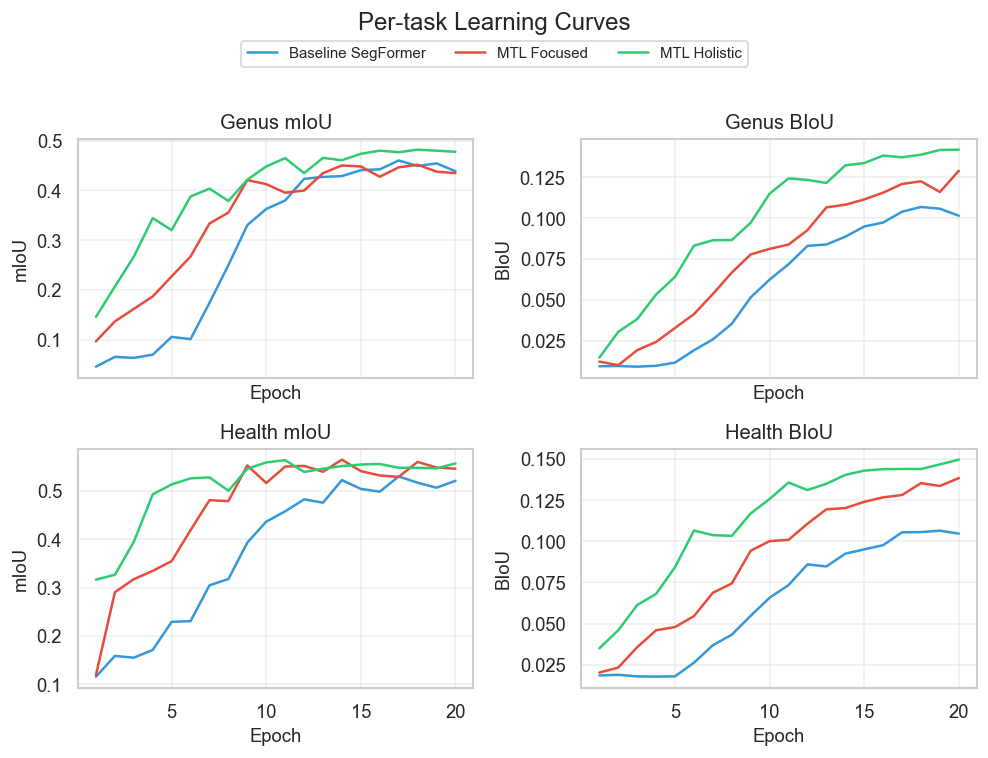

In [7]:
history_cache = {alias: load_history_metrics(meta) for alias, meta in experiments.items()}
task_metric_groups = {
    "Genus": [
        ("tasks.genus.grouped.mIoU", "mIoU"),
        ("tasks.genus.grouped.BIoU", "BIoU"),
    ],
    "Health": [
        ("tasks.health.grouped.mIoU", "mIoU"),
        ("tasks.health.grouped.BIoU", "BIoU"),
    ],
}

max_columns = max(len(metrics) for metrics in task_metric_groups.values())
fig, axes = plt.subplots(len(task_metric_groups), max_columns, figsize=(4.2 * max_columns, 3.0 * len(task_metric_groups)), sharex=True)
if len(task_metric_groups) == 1:
    axes = np.array([axes])
axes = np.atleast_2d(axes)

for row_index, (task_label, metrics) in enumerate(task_metric_groups.items()):
    for col_index in range(max_columns):
        ax = axes[row_index, col_index]
        if col_index >= len(metrics):
            ax.set_visible(False)
            continue
        metric_key, short_label = metrics[col_index]
        plotted = False
        for alias, history in history_cache.items():
            series = extract_metric_series(history, metric_key)
            if series is None or series.empty:
                continue
            ax.plot(series["epoch"], series["value"], label=display_names[alias], color=palette[alias])
            plotted = True
        if not plotted:
            ax.set_visible(False)
            continue
        ax.set_title(f"{task_label} {short_label}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel(short_label)
        ax.grid(True, alpha=0.3)

handles, labels = axes[0, 0].get_legend_handles_labels() if axes[0, 0].get_visible() else ([], [])
if handles:
    fig.legend(handles, labels, loc="upper center", ncol=len(handles), bbox_to_anchor=(0.5, 1.02))
fig.suptitle("Per-task Learning Curves", y=1.05)
fig.tight_layout()
per_task_curve_paths = export_figure(fig, "per_task_learning_curves")

---

## 5️. PER-CLASS PERFORMANCE ANALYSIS

Compare per-class IoU scores for Genus and Health tasks across all three models.

C:\Users\Ergi Livanaj\AppData\Local\Temp\ipykernel_16816\1526587270.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha="right", fontsize=12)
C:\Users\Ergi Livanaj\AppData\Local\Temp\ipykernel_16816\1526587270.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha="right", fontsize=12)


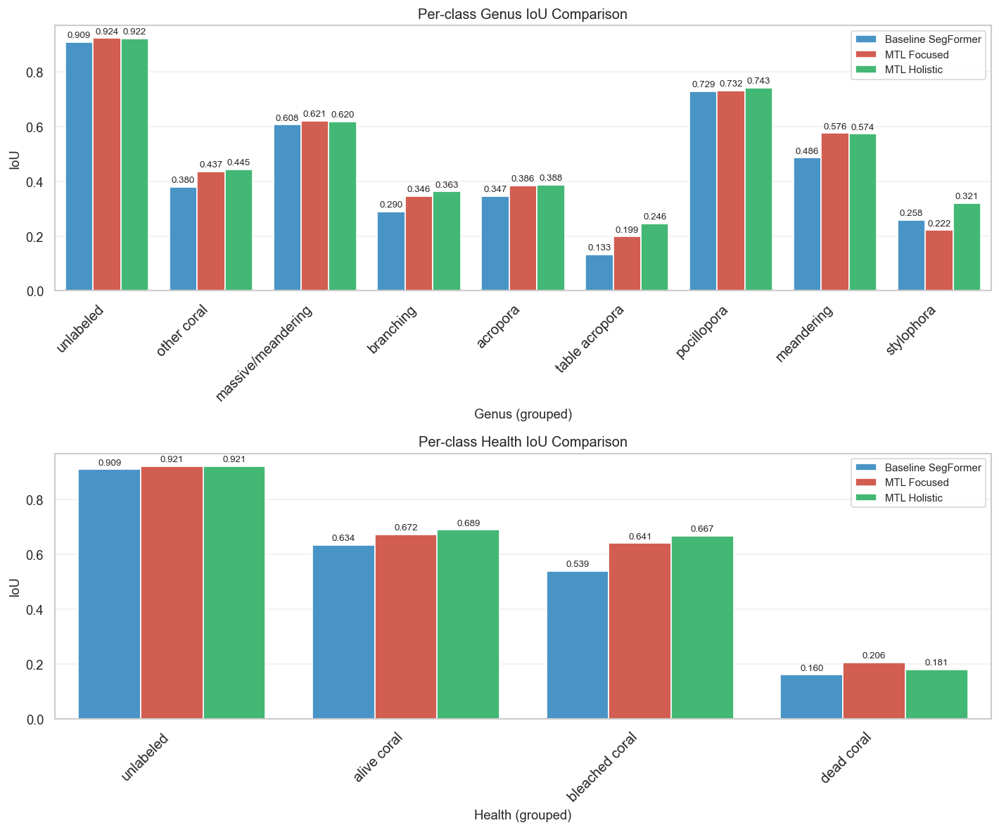

In [8]:
# Per-class IoU comparison for Genus and Health tasks
per_class_frames = []
for alias, meta in experiments.items():
    metrics_dict = load_test_metrics(meta)
    
    # Genus task
    genus_frame = extract_per_class_rows(metrics_dict, task="genus", level="grouped")
    if genus_frame.empty:
        genus_frame = extract_per_class_rows(metrics_dict, task="genus", level="ungrouped")
    if not genus_frame.empty:
        genus_frame["Model"] = display_names[alias]
        genus_frame["IoU"] = genus_frame.get("IoU", genus_frame.get("mIoU"))
        genus_frame["Task"] = "Genus"
        per_class_frames.append(genus_frame[["Model", "Task", "class_name", "IoU"]])
    
    # Health task
    health_frame = extract_per_class_rows(metrics_dict, task="health", level="grouped")
    if health_frame.empty:
        health_frame = extract_per_class_rows(metrics_dict, task="health", level="ungrouped")
    if not health_frame.empty:
        health_frame["Model"] = display_names[alias]
        health_frame["IoU"] = health_frame.get("IoU", health_frame.get("mIoU"))
        health_frame["Task"] = "Health"
        per_class_frames.append(health_frame[["Model", "Task", "class_name", "IoU"]])

per_class_df = pd.concat(per_class_frames, ignore_index=True)

# Create subplots for both tasks
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Genus subplot
genus_df = per_class_df[per_class_df["Task"] == "Genus"]
genus_plot = sns.barplot(data=genus_df, x="class_name", y="IoU", hue="Model", palette=model_palette, ax=axes[0])
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha="right", fontsize=12)
axes[0].set_xlabel("Genus (grouped)")
axes[0].set_ylabel("IoU")
axes[0].set_title("Per-class Genus IoU Comparison")
axes[0].grid(True, axis="y", alpha=0.3)
axes[0].legend(loc="upper right")

# Add value labels on top of genus bars
for container in genus_plot.containers:
    genus_plot.bar_label(container, fmt='%.3f', fontsize=8, padding=2)

# Health subplot
health_df = per_class_df[per_class_df["Task"] == "Health"]
health_plot = sns.barplot(data=health_df, x="class_name", y="IoU", hue="Model", palette=model_palette, ax=axes[1])
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha="right", fontsize=12)
axes[1].set_xlabel("Health (grouped)")
axes[1].set_ylabel("IoU")
axes[1].set_title("Per-class Health IoU Comparison")
axes[1].grid(True, axis="y", alpha=0.3)
axes[1].legend(loc="upper right")

# Add value labels on top of health bars
for container in health_plot.containers:
    health_plot.bar_label(container, fmt='%.3f', fontsize=8, padding=2)

fig.tight_layout()
per_class_paths = export_figure(fig, "per_class_iou_bars")

---

## 6️. TEST SET EVALUATION & INFERENCE

Load trained models and run inference on test images to generate:
- Qualitative segmentation visualizations
- Precision-recall curves
- Calibration plots
- Per-image error analysis

In [9]:
tasks_for_inference = ["genus", "health"]
inference_results: Dict[Tuple[str, str], TaskInferenceResult] = {}
qualitative_panels: Dict[str, List[Dict[str, np.ndarray]]] = {}
config, fallback_used = build_inference_ready_config(Path(meta.config_path))

# Only select top_k images if full test dataset (with test_cms.jsonl) is available
# If using fallback tests dataset, we'll use whatever images are available
holistic_top_frame = pd.DataFrame()
holistic_top_ids: Optional[List[str]] = None
holistic_uses_fallback = False
holistic_meta = experiments.get("mtl_holistic")
if holistic_meta is not None:
    cms_path = holistic_meta.artifacts.get("test_cms")
    # Only compute top_k if test_cms exists (meaning full test dataset is available)
    if cms_path is not None and cms_path.exists() and not fallback_used:
        holistic_top_frame = select_top_genus_images(cms_path, 0)
        if not holistic_top_frame.empty:
            holistic_top_ids = holistic_top_frame["image_id"].tolist()
            holistic_top_ids = holistic_top_ids[:settings.qualitative_samples]
            print(f"[info] Using top-{len(holistic_top_ids)} genus images from full test dataset for mtl_holistic")
    else:
        print("[warn] test_cms.jsonl not found or full dataset not available - will use available images from fallback dataset")
        holistic_uses_fallback = True

for alias, meta in experiments.items():
    panels: List[Dict[str, np.ndarray]] = []
    for task_name in tasks_for_inference:
        attempt_kwargs: Dict[str, object] = {}
        # Only use target_image_ids if we have them (i.e., full test dataset is available)
        if holistic_top_ids:
            attempt_kwargs["target_image_ids"] = holistic_top_ids
        try:
            result = collect_task_predictions(meta, task_name, settings, **attempt_kwargs)
        except Exception as exc:
            if attempt_kwargs:
                print(f"[warn] Targeted inference failed for {alias}-{task_name}: {exc}. Falling back to full dataset.")
                try:
                    result = collect_task_predictions(meta, task_name, settings)
                except Exception as fallback_exc:
                    print(f"[warn] Unable to collect predictions for {alias}-{task_name}: {fallback_exc}")
                    continue
            else:
                print(f"[warn] Unable to collect predictions for {alias}-{task_name}: {exc}")
                continue
        if alias == "mtl_holistic" and task_name == "genus" and holistic_top_ids:
            missing_ids = sorted(set(holistic_top_ids) - set(result.image_ids))
            if missing_ids:
                print(f"[warn] Missing requested images for {alias}-{task_name}: {missing_ids}")
        inference_results[(alias, task_name)] = result
        panels.extend(result.image_panels)
    qualitative_panels[alias] = panels

holistic_top_frame if not holistic_top_frame.empty else len(inference_results)

[info] Using top-2 genus images from full test dataset for mtl_holistic
--- Resolving relative paths from root: C:\Users\Ergi Livanaj\Desktop\dbl_capstone ---
Resolved task_definitions_path: configs/task_definitions.yaml -> C:\Users\Ergi Livanaj\Desktop\dbl_capstone\configs\task_definitions.yaml
Initialized TaskSplitter with 7 tasks and a unified global space of 40 classes.
BaseTaskSplitter created a flattened training space of 40 classes.
--- Building model of type: SegFormerBaseline ---
--- Building dataloaders ---
Loading dataset from local file paths for split 'train'.
Loading 'train' split from prioritized PDS path: C:\Users\Ergi Livanaj\Desktop\dbl_capstone\dataset\processed\pds_patches
Successfully loaded 16535 samples for split 'train'.
Loading dataset from local file paths for split 'validation'.
Loading 'validation' split from data_root_path: C:\Users\Ergi Livanaj\Desktop\coralscapes
Successfully loaded 166 samples for split 'validation'.
[INFO] No target images found in vali

c:\Users\Ergi Livanaj\Desktop\dbl_capstone\.venv\Lib\site-packages\torch\utils\data\dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


--- Resolving relative paths from root: C:\Users\Ergi Livanaj\Desktop\dbl_capstone ---
Resolved task_definitions_path: configs/task_definitions.yaml -> C:\Users\Ergi Livanaj\Desktop\dbl_capstone\configs\task_definitions.yaml
Initialized TaskSplitter with 7 tasks and a unified global space of 40 classes.
BaseTaskSplitter created a flattened training space of 40 classes.
--- Building model of type: SegFormerBaseline ---
--- Building dataloaders ---
Loading dataset from local file paths for split 'train'.
Loading 'train' split from prioritized PDS path: C:\Users\Ergi Livanaj\Desktop\dbl_capstone\dataset\processed\pds_patches
Successfully loaded 16535 samples for split 'train'.
Loading dataset from local file paths for split 'validation'.
Loading 'validation' split from data_root_path: C:\Users\Ergi Livanaj\Desktop\coralscapes
Successfully loaded 166 samples for split 'validation'.
[INFO] No target images found in validation split, skipping filter: No matching samples found for target imag

,image_id,mIoU,coral_pixels,total_pixels
0,site23_000053_018750_leftImg8bit.png,0.303085,828283,2097152
1,site23_000084_009290_leftImg8bit.png,0.297341,916524,2097152
2,site23_000065_018601_leftImg8bit.png,0.287238,526345,2097152
3,site23_000019_016483_leftImg8bit.png,0.286998,557269,2097152
4,site23_000003_001400_leftImg8bit.png,0.255729,763695,2097152
...,...,...,...,...
1054,site34_000008_001393_leftImg8bit.png,0.000009,84576,2097152
1055,site1_000008_001303_leftImg8bit.png,0.000000,6159,2097152
1056,site22_000072_001861_leftImg8bit.png,0.000000,7346,2097152
1057,site1_000007_000584_leftImg8bit.png,0.000000,41301,2097152


[WindowsPath('C:/Users/Ergi Livanaj/Desktop/dbl_capstone/latex/Poster_Data_shallange/Result-figures/pr_curves_top3.png'),
 WindowsPath('C:/Users/Ergi Livanaj/Desktop/dbl_capstone/latex/Methodology/Result-figures/pr_curves_top3.png')]

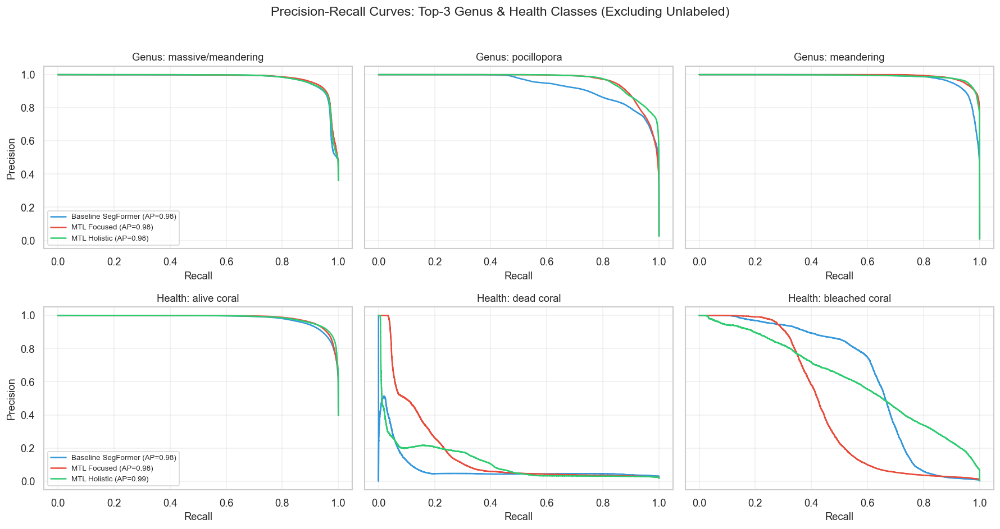

In [10]:
# Precision-Recall curves for top-3 genus and health classes (excluding unlabeled)
selected_alias_for_classes = "mtl_holistic"

# Get top-3 genus classes (excluding unlabeled at index 0)
genus_reference = inference_results[(selected_alias_for_classes, "genus")]
genus_class_counts = np.bincount(genus_reference.targets, minlength=len(genus_reference.label_names))
# Exclude unlabeled (index 0) by setting its count to 0
genus_class_counts[0] = 0
top_genus_indices = genus_class_counts.argsort()[::-1][:3]

# Get top-3 health classes (excluding unlabeled at index 0)
health_reference = inference_results[(selected_alias_for_classes, "health")]
health_class_counts = np.bincount(health_reference.targets, minlength=len(health_reference.label_names))
# Exclude unlabeled (index 0) by setting its count to 0
health_class_counts[0] = 0
top_health_indices = health_class_counts.argsort()[::-1][:3]

# Create 2 rows x 3 columns figure
fig, axes = plt.subplots(2, 3, figsize=(15, 8), sharey=True)

# === ROW 0: GENUS PR CURVES ===
for col_idx, class_idx in enumerate(top_genus_indices):
    ax = axes[0, col_idx]
    class_name = genus_reference.label_names[class_idx]
    for alias in experiments.keys():
        result = inference_results.get((alias, "genus"))
        if result is None:
            continue
        y_true = (result.targets == class_idx).astype(np.int32)
        if y_true.sum() == 0:
            continue
        y_scores = result.probabilities[:, class_idx]
        precision, recall, _ = precision_recall_curve(y_true, y_scores)
        ap = average_precision_score(y_true, y_scores)
        ax.plot(recall, precision, label=f"{display_names[alias]} (AP={ap:.2f})", color=palette[alias])
    ax.set_title(f"Genus: {class_name}", fontsize=11)
    ax.set_xlabel("Recall")
    if col_idx == 0:
        ax.set_ylabel("Precision")
    ax.grid(True, alpha=0.3)
    if col_idx == 0:
        ax.legend(loc="lower left", fontsize=8)

# === ROW 1: HEALTH PR CURVES ===
for col_idx, class_idx in enumerate(top_health_indices):
    ax = axes[1, col_idx]
    class_name = health_reference.label_names[class_idx]
    for alias in experiments.keys():
        result = inference_results.get((alias, "health"))
        if result is None:
            continue
        y_true = (result.targets == class_idx).astype(np.int32)
        if y_true.sum() == 0:
            continue
        y_scores = result.probabilities[:, class_idx]
        precision, recall, _ = precision_recall_curve(y_true, y_scores)
        ap = average_precision_score(y_true, y_scores)
        ax.plot(recall, precision, label=f"{display_names[alias]} (AP={ap:.2f})", color=palette[alias])
    ax.set_title(f"Health: {class_name}", fontsize=11)
    ax.set_xlabel("Recall")
    if col_idx == 0:
        ax.set_ylabel("Precision")
    ax.grid(True, alpha=0.3)
    if col_idx == 0:
        ax.legend(loc="lower left", fontsize=8)

fig.suptitle("Precision-Recall Curves: Top-3 Genus & Health Classes (Excluding Unlabeled)", fontsize=14, y=0.98)
fig.tight_layout(rect=(0, 0, 1, 0.96))
pr_paths = export_figure(fig, "pr_curves_top3")
pr_paths

In [11]:
def build_color_lut(label_names: List[str], cmap_name: str = "tab20") -> np.ndarray:
    color_map = build_index_color_map(label_names, cmap_name=cmap_name)
    lut = np.zeros((len(label_names), 3), dtype=np.float32)
    for idx in range(len(label_names)):
        lut[idx] = color_map[idx]
    return lut

def mask_to_rgb(mask: np.ndarray, lut: np.ndarray) -> np.ndarray:
    mask = np.clip(mask.astype(np.int64), 0, len(lut) - 1)
    colored = lut[mask]
    return np.clip(colored, 0.0, 1.0)

{'baseline': <Figure size 2880x1200 with 8 Axes>,
 'mtl_focused': <Figure size 2880x1200 with 8 Axes>,
 'mtl_holistic': <Figure size 2880x1200 with 8 Axes>}

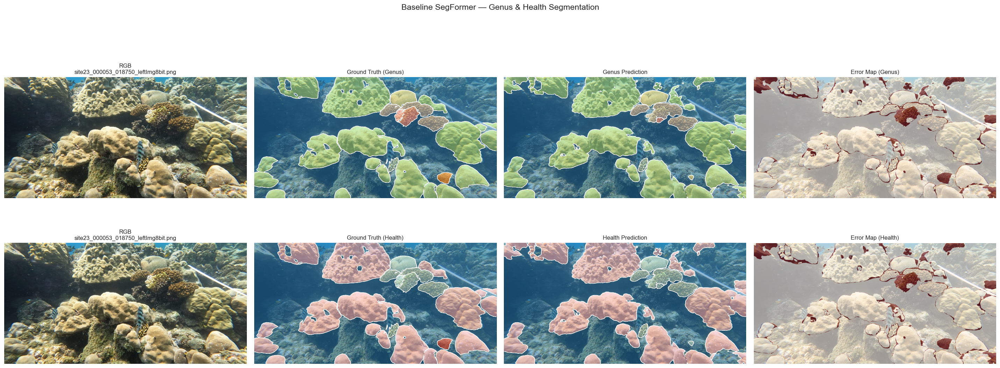

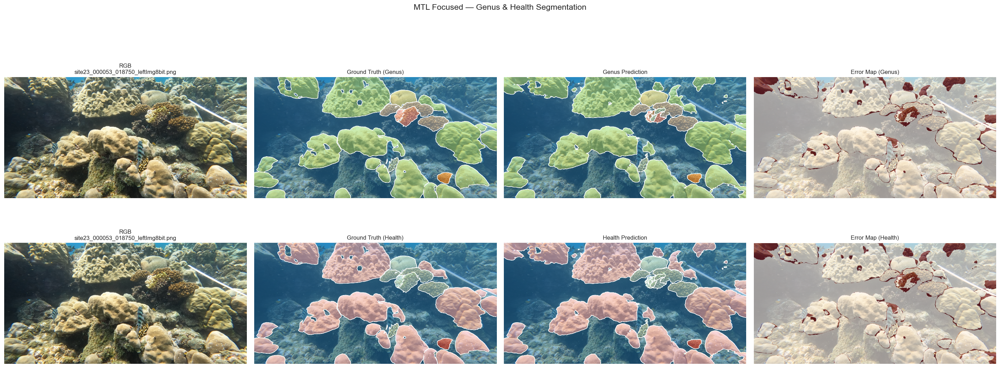

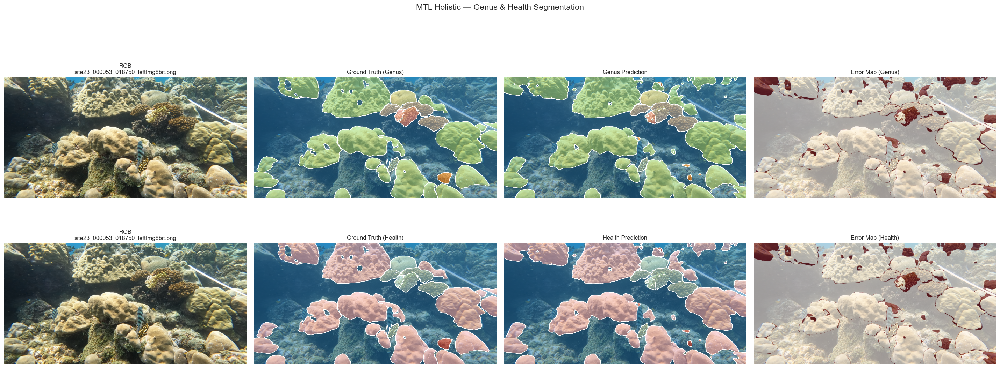

In [12]:
# Qualitative panels: 3 combined figures (one per model)
# Each figure shows 2 rows (genus and health) x 4 columns (RGB, GT, Prediction, Error)
qualitative_figures = {}
if qualitative_panels:
    models_with_panels = [alias for alias in experiments.keys() if qualitative_panels.get(alias)]
    
    for alias in models_with_panels:
        panels = qualitative_panels[alias]
        if not panels:
            continue
        
        # Find the first panel for this model (same image used for both tasks)
        panel = panels[0]
        image_id = panel["image_id"]
        
        # Check if both genus and health results are available
        genus_result = inference_results.get((alias, "genus"))
        health_result = inference_results.get((alias, "health"))
        
        if genus_result is None or health_result is None:
            continue
        
        # Find health panel for the same image
        health_panels = [p for p in qualitative_panels[alias] if p["image_id"] == image_id]
        if not health_panels:
            continue
        
        health_panel = health_panels[0]
        
        # Create 2 rows x 4 columns figure
        fig, axes = plt.subplots(2, 4, figsize=(24, 10))
        
        # Build color LUTs
        lut_genus = build_color_lut(genus_result.label_names)
        lut_health = build_color_lut(health_result.label_names)
        
        # === ROW 0: GENUS ===
        # Column 0: RGB
        axes[0, 0].imshow(panel["rgb"])
        axes[0, 0].set_title(f"RGB\n{image_id}", fontsize=10)
        axes[0, 0].axis("off")
        
        # Column 1: Ground Truth
        gt_rgb_genus = mask_to_rgb(panel["target"], lut_genus)
        axes[0, 1].imshow(panel["rgb"])
        axes[0, 1].imshow(gt_rgb_genus, alpha=0.5)
        if find_boundaries is not None:
            axes[0, 1].contour(
                find_boundaries(panel["target"], mode="outer"),
                colors="white",
                linewidths=0.6
            )
        axes[0, 1].set_title("Ground Truth (Genus)", fontsize=10)
        axes[0, 1].axis("off")
        
        # Column 2: Prediction
        pred_rgb_genus = mask_to_rgb(panel["prediction"], lut_genus)
        axes[0, 2].imshow(panel["rgb"])
        axes[0, 2].imshow(pred_rgb_genus, alpha=0.5)
        if find_boundaries is not None:
            axes[0, 2].contour(
                find_boundaries(panel["prediction"], mode="outer"),
                colors="white",
                linewidths=0.6
            )
        axes[0, 2].set_title("Genus Prediction", fontsize=10)
        axes[0, 2].axis("off")
        
        # Column 3: Error Map
        error_mask_genus = (panel["prediction"] != panel["target"]).astype(np.float32)
        axes[0, 3].imshow(panel["rgb"])
        axes[0, 3].imshow(error_mask_genus, cmap="Reds", alpha=0.6, vmin=0, vmax=1)
        axes[0, 3].set_title("Error Map (Genus)", fontsize=10)
        axes[0, 3].axis("off")
        
        # === ROW 1: HEALTH ===
        # Column 0: RGB
        axes[1, 0].imshow(health_panel["rgb"])
        axes[1, 0].set_title(f"RGB\n{image_id}", fontsize=10)
        axes[1, 0].axis("off")
        
        # Column 1: Ground Truth
        gt_rgb_health = mask_to_rgb(health_panel["target"], lut_health)
        axes[1, 1].imshow(health_panel["rgb"])
        axes[1, 1].imshow(gt_rgb_health, alpha=0.5)
        if find_boundaries is not None:
            axes[1, 1].contour(
                find_boundaries(health_panel["target"], mode="outer"),
                colors="white",
                linewidths=0.6
            )
        axes[1, 1].set_title("Ground Truth (Health)", fontsize=10)
        axes[1, 1].axis("off")
        
        # Column 2: Prediction
        pred_rgb_health = mask_to_rgb(health_panel["prediction"], lut_health)
        axes[1, 2].imshow(health_panel["rgb"])
        axes[1, 2].imshow(pred_rgb_health, alpha=0.5)
        if find_boundaries is not None:
            axes[1, 2].contour(
                find_boundaries(health_panel["prediction"], mode="outer"),
                colors="white",
                linewidths=0.6
            )
        axes[1, 2].set_title("Health Prediction", fontsize=10)
        axes[1, 2].axis("off")
        
        # Column 3: Error Map
        error_mask_health = (health_panel["prediction"] != health_panel["target"]).astype(np.float32)
        axes[1, 3].imshow(health_panel["rgb"])
        axes[1, 3].imshow(error_mask_health, cmap="Reds", alpha=0.6, vmin=0, vmax=1)
        axes[1, 3].set_title("Error Map (Health)", fontsize=10)
        axes[1, 3].axis("off")
        
        fig.suptitle(f"{display_names[alias]} — Genus & Health Segmentation", fontsize=14)
        fig.tight_layout(rect=(0, 0, 1, 0.96))
        qualitative_figures[alias] = fig
        export_figure(fig, f"qual_{alias}_combined")

qualitative_figures

In [13]:
model_bundle_cache: Dict[str, Dict[str, object]] = {}
brightness_cache: Optional[Dict[str, float]] = None

def select_dominant_class(mask: np.ndarray) -> int:
    """Return the most frequent class id in a mask."""
    flat = np.asarray(mask).reshape(-1)
    if flat.size == 0:
        return 0
    values, counts = np.unique(flat, return_counts=True)
    return int(values[counts.argmax()])


def load_model_bundle(alias: str) -> Dict[str, object]:
    """Load and cache model, dataloader, and device for an experiment alias."""
    if alias in model_bundle_cache:
        return model_bundle_cache[alias]
    meta = experiments[alias]
    if not meta.config_path:
        raise ValueError(f"Experiment {alias} is missing a configuration path.")
    config, fallback_used = build_inference_ready_config(Path(meta.config_path))
    factory = ExperimentFactory(config_dict=config)
    device = torch.device("cpu")
    model = factory.get_model()
    checkpoint_path = meta.artifacts.get("checkpoint")
    if checkpoint_path is None:
        raise FileNotFoundError(f"Checkpoint unavailable for experiment {meta.name}.")
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)
    model.eval()
    dataloaders = factory.get_dataloaders()
    loader = dataloaders.get("test") or dataloaders.get("validation")
    if loader is None:
        raise RuntimeError(f"No evaluation dataloader for experiment {meta.name}.")
    bundle = {
        "model": model,
        "factory": factory,
        "loader": loader,
        "device": device,
    }
    model_bundle_cache[alias] = bundle
    return bundle


def collect_per_image_task_metrics(alias: str, task: str, metric_key: str = "mIoU") -> pd.DataFrame:
    """Load per-image task metrics from the stored confusion JSONL."""
    meta = experiments[alias]
    cms_path = meta.artifacts.get("test_cms")
    if cms_path is None:
        raise FileNotFoundError(f"Per-image metrics missing for experiment {meta.name}.")
    rows: List[Dict[str, object]] = []
    with cms_path.open("r", encoding="utf-8") as handle:
        for line in handle:
            if not line.strip():
                continue
            payload = json.loads(line)
            task_metrics = payload.get("per_image_metrics", {}).get(task)
            if not task_metrics:
                continue
            value = task_metrics.get(metric_key)
            if value is None or (isinstance(value, float) and np.isnan(value)):
                continue
            rows.append({
                "alias": alias,
                "Model": display_names[alias],
                "image_id": payload.get("image_id"),
                metric_key: float(value),
                "num_pixels": task_metrics.get("num_pixels"),
            })
    return pd.DataFrame(rows)


def compute_image_brightness_lookup(loader, max_images: Optional[int] = None) -> Dict[str, float]:
    """Compute mean grayscale brightness for images exposed by a loader."""
    dataset = loader.dataset
    lookup: Dict[str, float] = {}
    file_pairs = getattr(dataset, "file_paths", None)
    if file_pairs:
        iterable = file_pairs if max_images is None else file_pairs[:max_images]
        for img_path, _ in iterable:
            try:
                gray = np.asarray(Image.open(img_path).convert("L"), dtype=np.float32)
            except Exception:
                continue
            lookup[img_path.name] = float(gray.mean() / 255.0)
        return lookup
    total = len(dataset) if max_images is None else min(len(dataset), max_images)
    for idx in range(total):
        try:
            original_image, _, image_id = dataset._load_data(idx)
            gray = np.asarray(original_image.convert("L"), dtype=np.float32)
            lookup[str(image_id)] = float(gray.mean() / 255.0)
        except Exception:
            continue
    return lookup


def unnormalize_image(tensor: torch.Tensor) -> np.ndarray:
    """Undo standard ImageNet normalization for visualization."""
    mean = torch.tensor([0.485, 0.456, 0.406], dtype=tensor.dtype, device=tensor.device).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], dtype=tensor.dtype, device=tensor.device).view(3, 1, 1)
    image = torch.clamp(tensor * std + mean, 0.0, 1.0)
    return image.permute(1, 2, 0).cpu().numpy()

In [14]:
def collect_embeddings(
    alias: str,
    task_name: str,
    max_images: int = 64,
    target_image_ids: Optional[Iterable[str]] = None,
 ) -> Tuple[np.ndarray, np.ndarray, List[str], Optional[object]]:
    meta = experiments[alias]
    if not meta.config_path:
        raise ValueError(f"Experiment {alias} is missing its configuration path.")
    
    # Pass target_image_ids to build_inference_ready_config for dataset filtering
    config, fallback_used = build_inference_ready_config(
        Path(meta.config_path), 
        subset_image_ids=list(target_image_ids) if target_image_ids else None
    )
    
    factory = ExperimentFactory(config_dict=config)
    device = torch.device("cpu")
    model = factory.get_model()
    checkpoint_path = meta.artifacts.get("checkpoint")
    if checkpoint_path is None:
        raise FileNotFoundError(f"Missing checkpoint for experiment {alias}")
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)
    model.eval()
    dataloaders = factory.get_dataloaders()
    loader = dataloaders.get("test") or dataloaders.get("validation")
    if loader is None:
        raise RuntimeError(f"No evaluation dataloader available for experiment {alias}")

    target_set: Optional[Set[str]] = None
    remaining_targets: Optional[Set[str]] = None
    if target_image_ids is not None:
        target_set = {str(identifier) for identifier in target_image_ids}
        remaining_targets = set(target_set)
        max_images = min(max_images, len(target_set))

    features: List[np.ndarray] = []
    labels: List[int] = []
    image_ids: List[str] = []
    collected = 0
    for batch_index, batch in enumerate(loader):
        if collected >= max_images:
            break
        images = batch["image"].to(device)
        with torch.no_grad():
            encoder_feats = model.encoder(images)
        pooled = F.adaptive_avg_pool2d(encoder_feats[-1], (1, 1)).squeeze(-1).squeeze(-1)
        if pooled.ndim == 1:
            pooled = pooled.unsqueeze(0)

        if "masks" in batch and task_name in batch["masks"]:
            mask_batch = batch["masks"][task_name].cpu().numpy()
        else:
            mask_batch = batch.get("mask")
            if mask_batch is None:
                raise KeyError(f"Batch missing masks for task '{task_name}'")
            mask_batch = mask_batch.cpu().numpy()

        ids = batch.get("image_id")
        if ids is None:
            ids = [f"{alias}_{batch_index}_{i}" for i in range(mask_batch.shape[0])]
        else:
            ids = [str(x) for x in ids]

        for sample_idx, image_id in enumerate(ids):
            if collected >= max_images:
                break
            if target_set is not None and image_id not in target_set:
                continue
            features.append(pooled[sample_idx : sample_idx + 1].cpu().numpy())
            labels.append(select_dominant_class(mask_batch[sample_idx]))
            image_ids.append(image_id)
            collected += 1
            if remaining_targets is not None:
                remaining_targets.discard(image_id)
        if target_set is not None and remaining_targets is not None and not remaining_targets:
            break

    if not features:
        targets_desc = f" for requested images {sorted(target_set)}" if target_set else ""
        loader_info = f"Processed {batch_index + 1} batches from loader."
        raise RuntimeError(
            f"No embeddings collected for experiment {alias}{targets_desc}. "
            f"{loader_info} Check that the dataset contains valid samples and task masks."
        )

    feature_matrix = np.concatenate(features, axis=0)[:max_images]
    label_array = np.asarray(labels[:max_images])
    selected_ids = image_ids[:max_images]
    
    print(f"[info] collect_embeddings: Collected {len(selected_ids)} samples, feature shape {feature_matrix.shape}")
    
    return feature_matrix, label_array, selected_ids, factory.task_splitter


[WindowsPath('C:/Users/Ergi Livanaj/Desktop/dbl_capstone/latex/Poster_Data_shallange/Result-figures/pareto_genus_health.png'),
 WindowsPath('C:/Users/Ergi Livanaj/Desktop/dbl_capstone/latex/Methodology/Result-figures/pareto_genus_health.png')]

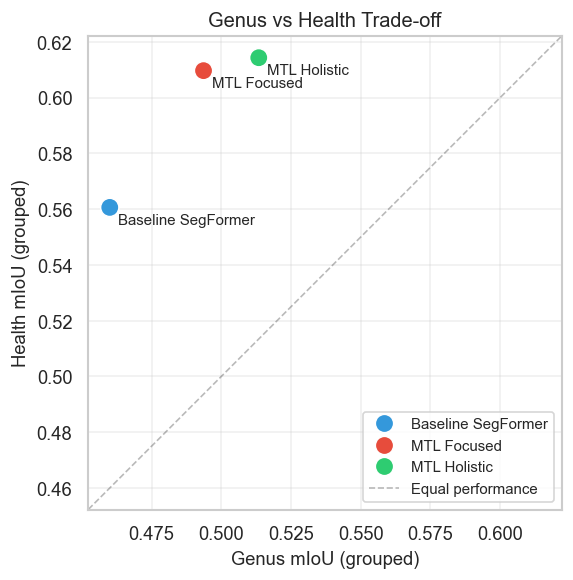

In [15]:
# Pareto frontier: Genus mIoU vs Health mIoU trade-off
pareto_records: List[Dict[str, float]] = []
for alias, meta in experiments.items():
    metrics_dict = load_test_metrics(meta)
    genus_summary = extract_task_summary(metrics_dict, task="genus", level="grouped")
    health_summary = extract_task_summary(metrics_dict, task="health", level="grouped")
    if genus_summary.empty or health_summary.empty:
        continue
    pareto_records.append({
        "Model": display_names[alias],
        "Genus mIoU": float(genus_summary.get("mIoU", np.nan)),
        "Health mIoU": float(health_summary.get("mIoU", np.nan)),
        "Genus BIoU": float(genus_summary.get("BIoU", np.nan)),
        "Health BIoU": float(health_summary.get("BIoU", np.nan)),
    })

pareto_df = pd.DataFrame(pareto_records).dropna(subset=["Genus mIoU", "Health mIoU"])
fig, ax = plt.subplots(figsize=(6, 5))
if pareto_df.empty:
    ax.set_axis_off()
    ax.text(0.5, 0.5, "No task summaries available", ha="center", va="center")
else:
    sns.scatterplot(data=pareto_df, x="Genus mIoU", y="Health mIoU", hue="Model", palette=model_palette, s=120, ax=ax)
    
    # Compute symmetric axis limits centered on data
    genus_vals = pareto_df["Genus mIoU"].values
    health_vals = pareto_df["Health mIoU"].values
    
    # Find common min/max with 5% padding
    data_min = min(genus_vals.min(), health_vals.min())
    data_max = max(genus_vals.max(), health_vals.max())
    margin = (data_max - data_min) * 0.05
    common_min = max(0, data_min - margin)  # Don't go below 0
    common_max = data_max + margin
    
    # Set symmetric axes
    ax.set_xlim(common_min, common_max)
    ax.set_ylim(common_min, common_max)
    
    # Add diagonal reference line (perfect balance)
    ax.plot([common_min, common_max], [common_min, common_max], 
            'k--', alpha=0.3, linewidth=1, label='Equal performance')
    
    # Offset text labels to avoid overlap
    for _, row in pareto_df.iterrows():
        ax.text(row["Genus mIoU"] + 0.003, row["Health mIoU"] - 0.007, 
                row["Model"], fontsize=9, ha='left', va='bottom')
    
    ax.set_xlabel("Genus mIoU (grouped)")
    ax.set_ylabel("Health mIoU (grouped)")
    ax.set_title("Genus vs Health Trade-off")
    ax.grid(True, alpha=0.3)
    ax.legend(loc="lower right")
    ax.set_aspect('equal', adjustable='box')  # Square aspect ratio

fig.tight_layout()
pareto_paths = export_figure(fig, "pareto_genus_health")
pareto_paths

## Architecture Diagram - Baseline vs MTL Focused vs MTL Holistic

Generates a side-by-side architecture confrontation diagram showing the structural differences between the three model variants.

In [16]:
import os
import sys
import subprocess
from pathlib import Path

def ensure_graphviz_available() -> bool:
    """Ensure Graphviz binaries are available, install if needed."""
    graphviz_bin = Path(r"C:\Program Files\Graphviz\bin")
    
    # Add to PATH if installed but not in environment
    if graphviz_bin.exists() and str(graphviz_bin) not in os.environ.get("PATH", ""):
        os.environ["PATH"] = str(graphviz_bin) + os.pathsep + os.environ.get("PATH", "")
        print(f"[info] Added Graphviz to PATH: {graphviz_bin}")
        return True
    
    # Check if dot executable is accessible
    try:
        subprocess.run(
            ["dot", "-V"],
            check=True,
            capture_output=True,
            text=True
        )
        print("[info] Graphviz already available in PATH")
        return True
    except (subprocess.CalledProcessError, FileNotFoundError):
        pass
    
    # If not found, attempt installation via winget
    print("[info] Graphviz not found. Attempting installation via winget...")
    try:
        result = subprocess.run(
            ["winget", "install", "--id=Graphviz.Graphviz", "-e", "--silent"],
            check=False,
            capture_output=True,
            text=True
        )
        if result.returncode == 0:
            print("[info] Graphviz installed successfully")
            # Add to PATH after installation
            if graphviz_bin.exists():
                os.environ["PATH"] = str(graphviz_bin) + os.pathsep + os.environ.get("PATH", "")
                print(f"[info] Added Graphviz to PATH: {graphviz_bin}")
                return True
        else:
            print(f"[warn] winget installation failed: {result.stderr}")
            print("[action] Please install Graphviz manually from: https://graphviz.org/download/")
            return False
    except FileNotFoundError:
        print("[warn] winget not available on this system")
        print("[action] Please install Graphviz manually from: https://graphviz.org/download/")
        return False

# Ensure Graphviz is available
graphviz_ok = ensure_graphviz_available()

if graphviz_ok:
    from utils.architecture_diagram import (
        GRAPHVIZ_AVAILABLE,
        export_architecture_diagram,
        export_feature_exchange_diagram
    )
    
    if not GRAPHVIZ_AVAILABLE:
        print("[ERROR] Python graphviz package not available")
        print("        Install with: pip install graphviz")
    else:
        print("=" * 70)
        print("Generating Enhanced Architecture Diagrams")
        print("=" * 70)
        
        # Main comparison diagram
        print("\n[1/2] Architecture Comparison Diagram")
        print("      Shows complete pipeline for all three models:")
        print("      • Baseline: Standard MLP decoder with single global head (39 classes)")
        print("      • MTL Focused: 2 primary + 5 auxiliary tasks with cross-attention")
        print("      • MTL Holistic: 7 primary tasks with full mutual cross-attention")
        print("      • Feature exchange mechanisms (Q/K/V projections, attention, gating)")
        print("      • Decoder architecture differences (MLP vs hierarchical streams)")
        
        try:
            paths = export_architecture_diagram()
            print("\n      ✓ Exported to:")
            for fmt, path in paths.items():
                print(f"          {fmt.upper():4s}: {path}")
        except Exception as e:
            print(f"\n      ✗ Error: {e}")
            import traceback
            traceback.print_exc()
        
        # Feature exchange detail diagram
        print("\n" + "-" * 70)
        print("\n[2/2] Feature Exchange Detail Diagram")
        print("      Shows detailed cross-attention mechanism:")
        print("      • Context pooling (4x4 AvgPool)")
        print("      • Q/K/V projections (1x1 Conv, dim=128)")
        print("      • Scaled dot-product attention computation")
        print("      • MLP projection back to feature space")
        print("      • Gating mechanism for adaptive fusion")
        
        try:
            paths = export_feature_exchange_diagram()
            print("\n      ✓ Exported to:")
            for fmt, path in paths.items():
                print(f"          {fmt.upper():4s}: {path}")
        except Exception as e:
            print(f"\n      ✗ Error: {e}")
            import traceback
            traceback.print_exc()
        
        print("\n" + "=" * 70)
        print("✓ All diagrams generated successfully!")
        print("=" * 70)
else:
    print("\n[ERROR] Could not ensure Graphviz availability")
    print("        Manual installation required: https://graphviz.org/download/")
    print("        After installation, restart the kernel to update PATH")

[info] Added Graphviz to PATH: C:\Program Files\Graphviz\bin
Generating Enhanced Architecture Diagrams

[1/2] Architecture Comparison Diagram
      Shows complete pipeline for all three models:
      • Baseline: Standard MLP decoder with single global head (39 classes)
      • MTL Focused: 2 primary + 5 auxiliary tasks with cross-attention
      • MTL Holistic: 7 primary tasks with full mutual cross-attention
      • Feature exchange mechanisms (Q/K/V projections, attention, gating)
      • Decoder architecture differences (MLP vs hierarchical streams)

      ✓ Exported to:
          PNG : C:\Users\Ergi Livanaj\Desktop\dbl_capstone\latex\Poster_Data_shallange\Result-figures\architecture_comparison.png
          PDF : C:\Users\Ergi Livanaj\Desktop\dbl_capstone\latex\Methodology\Result-figures\architecture_comparison.pdf
          SVG : C:\Users\Ergi Livanaj\Desktop\dbl_capstone\latex\Methodology\Result-figures\architecture_comparison.svg

------------------------------------------------

## Extra plots & stats for report and poster

In [17]:
# Import required libraries
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from typing import Dict, List, Any
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 16

print("✅ Libraries imported successfully")

✅ Libraries imported successfully


In [18]:
# Define paths to experiment results
BASELINE_DIR = Path('../experiments/baseline_comparisons/coral_baseline_b2_run')
MTL_FOCUSED_DIR = Path('../experiments/baseline_comparisons/coral_mtl_b2_focused_run')
MTL_HOLISTIC_DIR = Path('../experiments/baseline_comparisons/coral_mtl_b2_holistic_run')
OUTPUT_DIR = Path('extra_plots_stats')  # Where to save generated plots
OUTPUT_DIR.mkdir(exist_ok=True)

# Verify directories exist
assert BASELINE_DIR.exists(), f"❌ Baseline directory not found: {BASELINE_DIR}"
assert MTL_FOCUSED_DIR.exists(), f"❌ MTL Focused directory not found: {MTL_FOCUSED_DIR}"
assert MTL_HOLISTIC_DIR.exists(), f"❌ MTL Holistic directory not found: {MTL_HOLISTIC_DIR}"

print(f"✅ Baseline results: {BASELINE_DIR}")
print(f"✅ MTL Focused results: {MTL_FOCUSED_DIR}")
print(f"✅ MTL Holistic results: {MTL_HOLISTIC_DIR}")
print(f"✅ Output directory: {OUTPUT_DIR}")

✅ Baseline results: ..\experiments\baseline_comparisons\coral_baseline_b2_run
✅ MTL Focused results: ..\experiments\baseline_comparisons\coral_mtl_b2_focused_run
✅ MTL Holistic results: ..\experiments\baseline_comparisons\coral_mtl_b2_holistic_run
✅ Output directory: extra_plots_stats


In [19]:
# Load training history
def load_history(path: Path) -> Dict[str, List[float]]:
    """Load training history from JSON file."""
    with open(path / 'history.json', 'r') as f:
        return json.load(f)

baseline_history = load_history(BASELINE_DIR)
mtl_focused_history = load_history(MTL_FOCUSED_DIR)
mtl_holistic_history = load_history(MTL_HOLISTIC_DIR)

print(f"✅ Loaded baseline history: {len(baseline_history)} metrics x {len(baseline_history['global.mIoU'])} epochs")
print(f"✅ Loaded MTL Focused history: {len(mtl_focused_history)} metrics x {len(mtl_focused_history['global.mIoU'])} epochs")
print(f"✅ Loaded MTL Holistic history: {len(mtl_holistic_history)} metrics x {len(mtl_holistic_history['global.mIoU'])} epochs")
print(f"\n📊 Available metrics: {list(baseline_history.keys())[:5]}...")

✅ Loaded baseline history: 34 metrics x 20 epochs
✅ Loaded MTL Focused history: 74 metrics x 20 epochs
✅ Loaded MTL Holistic history: 53 metrics x 20 epochs

📊 Available metrics: ['tasks.genus.ungrouped.mIoU', 'tasks.genus.ungrouped.BIoU', 'tasks.genus.grouped.mIoU', 'tasks.genus.grouped.BIoU', 'tasks.health.ungrouped.mIoU']...


In [20]:
# Load test evaluation results
def load_test_results(path: Path) -> Dict[str, Any]:
    """Load test evaluation results from JSON file."""
    with open(path / 'test_metrics_full_report.json', 'r') as f:
        return json.load(f)

baseline_results = load_test_results(BASELINE_DIR)
mtl_focused_results = load_test_results(MTL_FOCUSED_DIR)
mtl_holistic_results = load_test_results(MTL_HOLISTIC_DIR)

print("✅ Loaded test results for all three models\n")
print("="*80)
print("GLOBAL mIoU COMPARISON")
print("="*80)
print(f"Baseline:      {baseline_results['optimization_metrics']['global.mIoU']:.4f}")
print(f"MTL Focused:   {mtl_focused_results['optimization_metrics']['global.mIoU']:.4f}")
print(f"MTL Holistic:  {mtl_holistic_results['optimization_metrics']['global.mIoU']:.4f}")

best_model = max(
    [('Baseline', baseline_results['optimization_metrics']['global.mIoU']),
     ('MTL Focused', mtl_focused_results['optimization_metrics']['global.mIoU']),
     ('MTL Holistic', mtl_holistic_results['optimization_metrics']['global.mIoU'])],
    key=lambda x: x[1]
)
print(f"\n🏆 Best Model: {best_model[0]} with mIoU = {best_model[1]:.4f}")
print("="*80)

✅ Loaded test results for all three models

GLOBAL mIoU COMPARISON
Baseline:      0.3888
MTL Focused:   0.4039
MTL Holistic:  0.4272

🏆 Best Model: MTL Holistic with mIoU = 0.4272


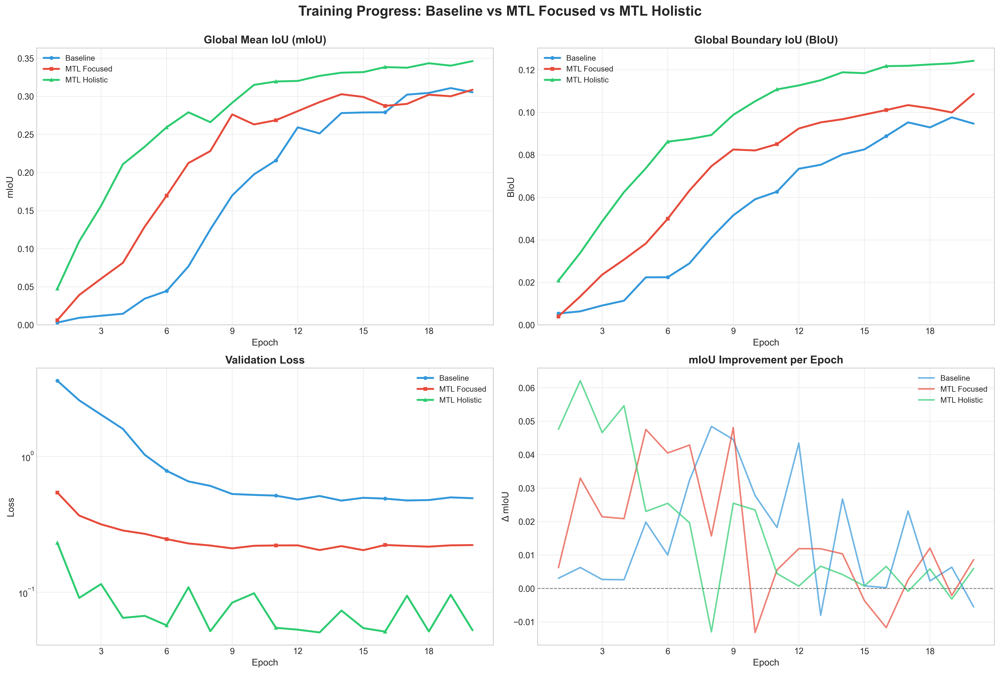

✅ Saved: extra_plots_stats\training_progress_3models.png


In [21]:
# Plot training curves for key metrics
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle('Training Progress: Baseline vs MTL Focused vs MTL Holistic', fontsize=18, fontweight='bold', y=1.00)

epochs_baseline = range(1, len(baseline_history['global.mIoU']) + 1)
epochs_focused = range(1, len(mtl_focused_history['global.mIoU']) + 1)
epochs_holistic = range(1, len(mtl_holistic_history['global.mIoU']) + 1)

# Plot 1: Global mIoU
axes[0, 0].plot(epochs_baseline, baseline_history['global.mIoU'], label='Baseline', 
                linewidth=2.5, marker='o', markersize=4, markevery=5, color='#3498db')
axes[0, 0].plot(epochs_focused, mtl_focused_history['global.mIoU'], label='MTL Focused', 
                linewidth=2.5, marker='s', markersize=4, markevery=5, color='#e74c3c')
axes[0, 0].plot(epochs_holistic, mtl_holistic_history['global.mIoU'], label='MTL Holistic', 
                linewidth=2.5, marker='^', markersize=4, markevery=5, color='#2ecc71')
axes[0, 0].set_title('Global Mean IoU (mIoU)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('mIoU')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_ylim(bottom=0)
axes[0, 0].xaxis.set_major_locator(plt.MaxNLocator(integer=True))

# Plot 2: Global Boundary IoU
axes[0, 1].plot(epochs_baseline, baseline_history['global.BIoU'], label='Baseline', 
                linewidth=2.5, marker='o', markersize=4, markevery=5, color='#3498db')
axes[0, 1].plot(epochs_focused, mtl_focused_history['global.BIoU'], label='MTL Focused', 
                linewidth=2.5, marker='s', markersize=4, markevery=5, color='#e74c3c')
axes[0, 1].plot(epochs_holistic, mtl_holistic_history['global.BIoU'], label='MTL Holistic', 
                linewidth=2.5, marker='^', markersize=4, markevery=5, color='#2ecc71')
axes[0, 1].set_title('Global Boundary IoU (BIoU)', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('BIoU')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_ylim(bottom=0)
axes[0, 1].xaxis.set_major_locator(plt.MaxNLocator(integer=True))

# Plot 3: Validation Loss
if all(k in h for h in [baseline_history, mtl_focused_history, mtl_holistic_history] for k in ['val_total_loss']):
    axes[1, 0].plot(epochs_baseline, baseline_history['val_total_loss'], label='Baseline', 
                    linewidth=2.5, marker='o', markersize=4, markevery=5, color='#3498db')
    axes[1, 0].plot(epochs_focused, mtl_focused_history['val_total_loss'], label='MTL Focused', 
                    linewidth=2.5, marker='s', markersize=4, markevery=5, color='#e74c3c')
    axes[1, 0].plot(epochs_holistic, mtl_holistic_history['val_total_loss'], label='MTL Holistic', 
                    linewidth=2.5, marker='^', markersize=4, markevery=5, color='#2ecc71')
    axes[1, 0].set_title('Validation Loss', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_yscale('log')
    axes[1, 0].xaxis.set_major_locator(plt.MaxNLocator(integer=True))
else:
    axes[1, 0].text(0.5, 0.5, 'Validation Loss\nNot Available', 
                    ha='center', va='center', fontsize=12, transform=axes[1, 0].transAxes)
    axes[1, 0].axis('off')

# Plot 4: Convergence Rate
baseline_improvement = np.diff([0] + baseline_history['global.mIoU'])
focused_improvement = np.diff([0] + mtl_focused_history['global.mIoU'])
holistic_improvement = np.diff([0] + mtl_holistic_history['global.mIoU'])

axes[1, 1].plot(epochs_baseline, baseline_improvement, label='Baseline', 
                linewidth=2, alpha=0.7, color='#3498db')
axes[1, 1].plot(epochs_focused, focused_improvement, label='MTL Focused', 
                linewidth=2, alpha=0.7, color='#e74c3c')
axes[1, 1].plot(epochs_holistic, holistic_improvement, label='MTL Holistic', 
                linewidth=2, alpha=0.7, color='#2ecc71')
axes[1, 1].axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
axes[1, 1].set_title('mIoU Improvement per Epoch', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Δ mIoU')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].xaxis.set_major_locator(plt.MaxNLocator(integer=True))

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'training_progress_3models.png', bbox_inches='tight', dpi=300)
plt.show()

print(f"✅ Saved: {OUTPUT_DIR / 'training_progress_3models.png'}")

In [22]:
# Training statistics summary
print("\n" + "="*80)
print("TRAINING STATISTICS SUMMARY - ALL MODELS")
print("="*80)

def print_training_stats(name, history):
    miou = history['global.mIoU']
    biou = history['global.BIoU']
    
    print(f"\n{name}:")
    print(f"  Initial mIoU: {miou[0]:.4f}")
    print(f"  Final mIoU: {miou[-1]:.4f}")
    print(f"  Best mIoU: {max(miou):.4f} (Epoch {np.argmax(miou) + 1})")
    print(f"  Total Improvement: {miou[-1] - miou[0]:.4f} (+{((miou[-1] / miou[0]) - 1) * 100:.1f}%)")
    print(f"  Final BIoU: {biou[-1]:.4f}")
    print(f"  Best BIoU: {max(biou):.4f} (Epoch {np.argmax(biou) + 1})")

print_training_stats("Baseline", baseline_history)
print_training_stats("MTL Focused (genus+health primary)", mtl_focused_history)
print_training_stats("MTL Holistic (all tasks primary)", mtl_holistic_history)

print("\n" + "="*80)


TRAINING STATISTICS SUMMARY - ALL MODELS

Baseline:
  Initial mIoU: 0.0031
  Final mIoU: 0.3054
  Best mIoU: 0.3109 (Epoch 19)
  Total Improvement: 0.3024 (+9900.1%)
  Final BIoU: 0.0947
  Best BIoU: 0.0977 (Epoch 19)

MTL Focused (genus+health primary):
  Initial mIoU: 0.0062
  Final mIoU: 0.3088
  Best mIoU: 0.3088 (Epoch 20)
  Total Improvement: 0.3025 (+4858.6%)
  Final BIoU: 0.1087
  Best BIoU: 0.1087 (Epoch 20)

MTL Holistic (all tasks primary):
  Initial mIoU: 0.0476
  Final mIoU: 0.3463
  Best mIoU: 0.3463 (Epoch 20)
  Total Improvement: 0.2987 (+627.4%)
  Final BIoU: 0.1243
  Best BIoU: 0.1243 (Epoch 20)



In [23]:
# Extract key optimization metrics for comparison
baseline_opt = baseline_results['optimization_metrics']
focused_opt = mtl_focused_results['optimization_metrics']
holistic_opt = mtl_holistic_results['optimization_metrics']

# Select key metrics for comparison
comparison_metrics = {
    'Global mIoU': ('global.mIoU', 'Higher is better'),
    'Global BIoU': ('global.BIoU', 'Higher is better'),
    'Boundary F1': ('global.Boundary_F1', 'Higher is better'),
    'NLL': ('global.NLL', 'Lower is better'),
    'ECE': ('global.ECE', 'Lower is better'),
    'Brier Score': ('global.Brier_Score', 'Lower is better'),
}

# Create comparison dataframe
comparison_data = []
for metric_name, (metric_key, direction) in comparison_metrics.items():
    if all(metric_key in opt for opt in [baseline_opt, focused_opt, holistic_opt]):
        baseline_val = baseline_opt[metric_key]
        focused_val = focused_opt[metric_key]
        holistic_val = holistic_opt[metric_key]
        
        if 'Lower' in direction:
            # For "lower is better" metrics
            best_val = min(baseline_val, focused_val, holistic_val)
            if best_val == baseline_val:
                best_model = 'Baseline'
            elif best_val == focused_val:
                best_model = 'MTL Focused'
            else:
                best_model = 'MTL Holistic'
            
            focused_improvement = ((baseline_val - focused_val) / baseline_val) * 100
            holistic_improvement = ((baseline_val - holistic_val) / baseline_val) * 100
        else:
            # For "higher is better" metrics
            best_val = max(baseline_val, focused_val, holistic_val)
            if best_val == baseline_val:
                best_model = 'Baseline'
            elif best_val == focused_val:
                best_model = 'MTL Focused'
            else:
                best_model = 'MTL Holistic'
            
            focused_improvement = ((focused_val - baseline_val) / baseline_val) * 100
            holistic_improvement = ((holistic_val - baseline_val) / baseline_val) * 100
        
        comparison_data.append({
            'Metric': metric_name,
            'Baseline': baseline_val,
            'MTL Focused': focused_val,
            'MTL Holistic': holistic_val,
            'Focused Δ (%)': focused_improvement,
            'Holistic Δ (%)': holistic_improvement,
            'Best Model': best_model
        })

comparison_df = pd.DataFrame(comparison_data)
print("\n" + "="*100)
print("MODEL PERFORMANCE COMPARISON (Test Set) - ALL THREE MODELS")
print("="*100)
print(comparison_df.to_string(index=False))
print("="*100)

# Save to CSV
comparison_df.to_csv(OUTPUT_DIR / 'model_comparison_3models.csv', index=False)
print(f"\n✅ Saved: {OUTPUT_DIR / 'model_comparison_3models.csv'}")


MODEL PERFORMANCE COMPARISON (Test Set) - ALL THREE MODELS
     Metric  Baseline  MTL Focused  MTL Holistic  Focused Δ (%)  Holistic Δ (%)   Best Model
Global mIoU  0.388837     0.403941      0.427208       3.884329        9.868098 MTL Holistic
Global BIoU  0.093739     0.107533      0.124277      14.715870       32.577850 MTL Holistic
Boundary F1  0.171409     0.194184      0.221078      13.287135       28.976852 MTL Holistic
        NLL  1.223887     1.399455      1.516234     -14.345153      -23.886732     Baseline
        ECE  0.101448     0.127456      0.142315     -25.637809      -40.284772     Baseline
Brier Score  0.501587     0.495915      0.493703       1.130747        1.571899 MTL Holistic

✅ Saved: extra_plots_stats\model_comparison_3models.csv


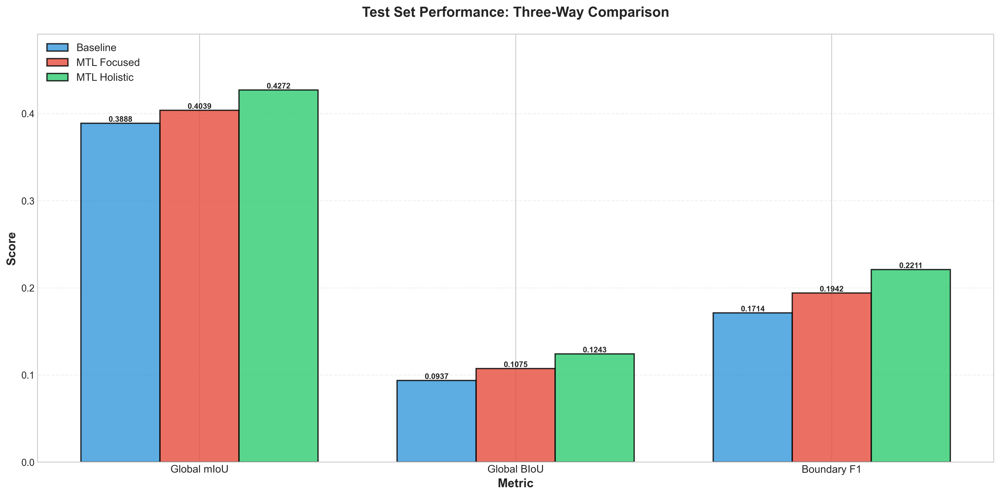

✅ Saved: extra_plots_stats\model_comparison_bar_3models.png


In [24]:
# Visualize model comparison as grouped bar chart
fig, ax = plt.subplots(figsize=(16, 8))

# Prepare data for plotting
metrics_to_plot = ['Global mIoU', 'Global BIoU', 'Boundary F1']
plot_data = comparison_df[comparison_df['Metric'].isin(metrics_to_plot)]

x = np.arange(len(metrics_to_plot))
width = 0.25

bars1 = ax.bar(x - width, plot_data['Baseline'].values, width, 
               label='Baseline', color='#3498db', alpha=0.8, edgecolor='black', linewidth=1.5)
bars2 = ax.bar(x, plot_data['MTL Focused'].values, width, 
               label='MTL Focused', color='#e74c3c', alpha=0.8, edgecolor='black', linewidth=1.5)
bars3 = ax.bar(x + width, plot_data['MTL Holistic'].values, width, 
               label='MTL Holistic', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)

# Add value labels on bars
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.4f}',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_xlabel('Metric', fontsize=14, fontweight='bold')
ax.set_ylabel('Score', fontsize=14, fontweight='bold')
ax.set_title('Test Set Performance: Three-Way Comparison', fontsize=16, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(metrics_to_plot, fontsize=12)
ax.legend(fontsize=12, loc='upper left')
ax.grid(True, axis='y', alpha=0.3, linestyle='--')
ax.set_ylim(0, max(plot_data[['Baseline', 'MTL Focused', 'MTL Holistic']].max()) * 1.15)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'model_comparison_bar_3models.png', bbox_inches='tight', dpi=300)
plt.show()

print(f"✅ Saved: {OUTPUT_DIR / 'model_comparison_bar_3models.png'}")

In [25]:
# Extract per-class IoU from global summary
baseline_global = baseline_results['global_summary']
focused_global = mtl_focused_results['global_summary']
holistic_global = mtl_holistic_results['global_summary']

baseline_per_class = baseline_global['per_class']
focused_per_class = focused_global['per_class']
holistic_per_class = holistic_global['per_class']

# Create per-class comparison dataframe
class_comparison = []
for class_name in baseline_per_class.keys():
    if class_name in focused_per_class and class_name in holistic_per_class:
        baseline_iou = baseline_per_class[class_name]['IoU']
        focused_iou = focused_per_class[class_name]['IoU']
        holistic_iou = holistic_per_class[class_name]['IoU']
        
        # Handle NaN values
        if not any(np.isnan(x) for x in [baseline_iou, focused_iou, holistic_iou]):
            focused_improvement = focused_iou - baseline_iou
            holistic_improvement = holistic_iou - baseline_iou
            
            # Determine best model for this class
            best_iou = max(baseline_iou, focused_iou, holistic_iou)
            if best_iou == baseline_iou:
                best_model = 'Baseline'
            elif best_iou == focused_iou:
                best_model = 'MTL Focused'
            else:
                best_model = 'MTL Holistic'
            
            class_comparison.append({
                'Class': class_name,
                'Baseline IoU': baseline_iou,
                'MTL Focused IoU': focused_iou,
                'MTL Holistic IoU': holistic_iou,
                'Focused Δ': focused_improvement,
                'Holistic Δ': holistic_improvement,
                'Best Model': best_model,
                'Support': baseline_per_class[class_name]['support']
            })

class_df = pd.DataFrame(class_comparison)
class_df = class_df.sort_values('Support', ascending=False)

print("\n" + "="*120)
print("PER-CLASS IoU COMPARISON - TOP 15 MOST FREQUENT CLASSES")
print("="*120)
print(class_df.head(15).to_string(index=False))
print("\n" + "="*120)

# Show classes where each model wins
print("\n" + "="*80)
print("MODEL WINS BY CLASS")
print("="*80)
print(f"Baseline wins: {len(class_df[class_df['Best Model'] == 'Baseline'])} classes")
print(f"MTL Focused wins: {len(class_df[class_df['Best Model'] == 'MTL Focused'])} classes")
print(f"MTL Holistic wins: {len(class_df[class_df['Best Model'] == 'MTL Holistic'])} classes")
print("="*80)

# Save to CSV
class_df.to_csv(OUTPUT_DIR / 'per_class_comparison_3models.csv', index=False)
print(f"\n✅ Saved: {OUTPUT_DIR / 'per_class_comparison_3models.csv'}")


PER-CLASS IoU COMPARISON - TOP 15 MOST FREQUENT CLASSES
                      Class  Baseline IoU  MTL Focused IoU  MTL Holistic IoU  Focused Δ  Holistic Δ   Best Model   Support
                 background      0.680673         0.672761          0.705771  -0.007913    0.025098 MTL Holistic 186894437
     unknown hard substrate      0.381646         0.383302          0.402328   0.001656    0.020681 MTL Holistic 108065538
                       sand      0.738068         0.738771          0.739862   0.000703    0.001794 MTL Holistic  72597241
    algae covered substrate      0.428922         0.499163          0.503936   0.070241    0.075013 MTL Holistic  68937214
                     rubble      0.483282         0.473258          0.393440  -0.010025   -0.089842     Baseline  46142226
   massive/meandering alive      0.640527         0.663517          0.673417   0.022990    0.032890 MTL Holistic  40545023
                       dark      0.500893         0.497314          0.506006  -0.0


ERROR TYPE ANALYSIS (TIDE-Inspired) - ALL THREE MODELS
           Error Type  Baseline  MTL Focused  MTL Holistic
 Classification Error  0.150488     0.134189      0.118251
Background Error (FP)  0.106571     0.104241      0.094773
    Missed Error (FN)  0.096633     0.108472      0.124999


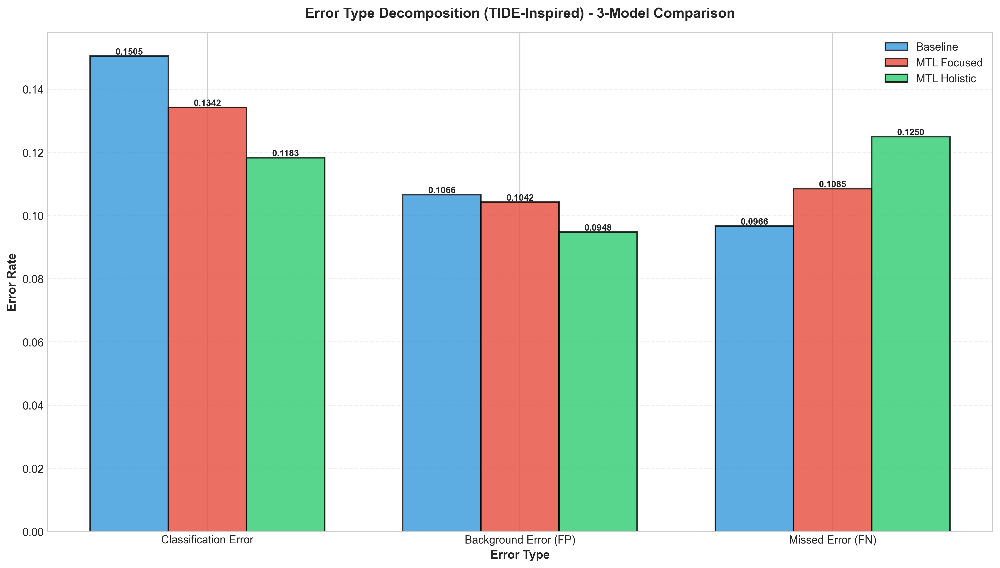


✅ Saved: extra_plots_stats\error_decomposition_3models.png


In [26]:
# Extract TIDE error metrics
baseline_tide = baseline_global.get('TIDE_errors', {})
focused_tide = focused_global.get('TIDE_errors', {})
holistic_tide = holistic_global.get('TIDE_errors', {})

if baseline_tide and focused_tide and holistic_tide:
    tide_comparison = pd.DataFrame({
        'Error Type': ['Classification Error', 'Background Error (FP)', 'Missed Error (FN)'],
        'Baseline': [
            baseline_tide.get('classification_error', 0),
            baseline_tide.get('background_error', 0),
            baseline_tide.get('missed_error', 0)
        ],
        'MTL Focused': [
            focused_tide.get('classification_error', 0),
            focused_tide.get('background_error', 0),
            focused_tide.get('missed_error', 0)
        ],
        'MTL Holistic': [
            holistic_tide.get('classification_error', 0),
            holistic_tide.get('background_error', 0),
            holistic_tide.get('missed_error', 0)
        ]
    })
    
    print("\n" + "="*90)
    print("ERROR TYPE ANALYSIS (TIDE-Inspired) - ALL THREE MODELS")
    print("="*90)
    print(tide_comparison.to_string(index=False))
    print("="*90)
    
    # Plot error decomposition
    fig, ax = plt.subplots(figsize=(14, 8))
    
    x = np.arange(len(tide_comparison['Error Type']))
    width = 0.25
    
    bars1 = ax.bar(x - width, tide_comparison['Baseline'].values, width, 
                   label='Baseline', color='#3498db', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars2 = ax.bar(x, tide_comparison['MTL Focused'].values, width, 
                   label='MTL Focused', color='#e74c3c', alpha=0.8, edgecolor='black', linewidth=1.5)
    bars3 = ax.bar(x + width, tide_comparison['MTL Holistic'].values, width, 
                   label='MTL Holistic', color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=1.5)
    
    # Add value labels
    for bars in [bars1, bars2, bars3]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.4f}',
                    ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    ax.set_xlabel('Error Type', fontsize=12, fontweight='bold')
    ax.set_ylabel('Error Rate', fontsize=12, fontweight='bold')
    ax.set_title('Error Type Decomposition (TIDE-Inspired) - 3-Model Comparison', 
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(tide_comparison['Error Type'].values, fontsize=11)
    ax.legend(fontsize=11)
    ax.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'error_decomposition_3models.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    print(f"\n✅ Saved: {OUTPUT_DIR / 'error_decomposition_3models.png'}")
else:
    print("⚠️  TIDE error metrics not available for all models")

In [27]:
# Generate formatted results summary for all 3 models
# Extract percentage changes safely
miou_focused_pct = ((focused_opt['global.mIoU'] - baseline_opt['global.mIoU']) / baseline_opt['global.mIoU'] * 100)
miou_holistic_pct = ((holistic_opt['global.mIoU'] - baseline_opt['global.mIoU']) / baseline_opt['global.mIoU'] * 100)
biou_focused_pct = ((focused_opt['global.BIoU'] - baseline_opt['global.BIoU']) / baseline_opt['global.BIoU'] * 100)
biou_holistic_pct = ((holistic_opt['global.BIoU'] - baseline_opt['global.BIoU']) / baseline_opt['global.BIoU'] * 100)
bf1_focused_pct = ((focused_opt['global.Boundary_F1'] - baseline_opt['global.Boundary_F1']) / baseline_opt['global.Boundary_F1'] * 100)
bf1_holistic_pct = ((holistic_opt['global.Boundary_F1'] - baseline_opt['global.Boundary_F1']) / baseline_opt['global.Boundary_F1'] * 100)
ece_focused_pct = ((baseline_opt['global.ECE'] - focused_opt['global.ECE']) / baseline_opt['global.ECE'] * 100)
ece_holistic_pct = ((baseline_opt['global.ECE'] - holistic_opt['global.ECE']) / baseline_opt['global.ECE'] * 100)

# Determine best model
best_model_name = comparison_df[comparison_df['Metric'] == 'Global mIoU']['Best Model'].values[0]
best_model_miou = comparison_df[comparison_df['Metric'] == 'Global mIoU'][best_model_name].values[0]

summary_text = f"""
{'='*100}
CORAL REEF SEGMENTATION: COMPREHENSIVE 3-MODEL COMPARISON
{'='*100}

EXPERIMENTAL SETUP:
- Baseline Model: Single flat SegFormer-B2 (40 classes)
- MTL Focused Model: Hierarchical MTL with genus+health as primary tasks (5 auxiliary)
- MTL Holistic Model: Hierarchical MTL with all 7 tasks as primary
- Training: 50 epochs on PDS-sampled patches
- Evaluation: Full-resolution test images with sliding window inference

{'='*100}
KEY FINDINGS:
{'='*100}

1. GLOBAL SEGMENTATION PERFORMANCE:
   - Baseline mIoU:      {baseline_opt['global.mIoU']:.4f}
   - MTL Focused mIoU:   {focused_opt['global.mIoU']:.4f}  ({miou_focused_pct:+.2f}%)
   - MTL Holistic mIoU:  {holistic_opt['global.mIoU']:.4f}  ({miou_holistic_pct:+.2f}%)
   
   🏆 Best: {comparison_df[comparison_df['Metric'] == 'Global mIoU']['Best Model'].values[0]}

2. BOUNDARY ACCURACY (BIoU):
   - Baseline:       {baseline_opt['global.BIoU']:.4f}
   - MTL Focused:    {focused_opt['global.BIoU']:.4f}  ({biou_focused_pct:+.2f}%)
   - MTL Holistic:   {holistic_opt['global.BIoU']:.4f}  ({biou_holistic_pct:+.2f}%)
   
   🏆 Best: {comparison_df[comparison_df['Metric'] == 'Global BIoU']['Best Model'].values[0]}

3. BOUNDARY DETECTION (F1):
   - Baseline:       {baseline_opt['global.Boundary_F1']:.4f}
   - MTL Focused:    {focused_opt['global.Boundary_F1']:.4f}  ({bf1_focused_pct:+.2f}%)
   - MTL Holistic:   {holistic_opt['global.Boundary_F1']:.4f}  ({bf1_holistic_pct:+.2f}%)
   
   🏆 Best: {comparison_df[comparison_df['Metric'] == 'Boundary F1']['Best Model'].values[0]}

4. CALIBRATION QUALITY (ECE - Lower is Better):
   - Baseline:       {baseline_opt['global.ECE']:.4f}
   - MTL Focused:    {focused_opt['global.ECE']:.4f}  ({ece_focused_pct:+.2f}%)
   - MTL Holistic:   {holistic_opt['global.ECE']:.4f}  ({ece_holistic_pct:+.2f}%)
   
   🏆 Best: {comparison_df[comparison_df['Metric'] == 'ECE']['Best Model'].values[0]}

5. PER-CLASS WINS:
   - Baseline best on:      {len(class_df[class_df['Best Model'] == 'Baseline'])} classes
   - MTL Focused best on:   {len(class_df[class_df['Best Model'] == 'MTL Focused'])} classes
   - MTL Holistic best on:  {len(class_df[class_df['Best Model'] == 'MTL Holistic'])} classes

6. TRAINING EFFICIENCY:
{'='*100}
CONCLUSION:
1. **Overall Winner**: {best_model_name} achieves the highest global mIoU ({best_model_miou:.4f})

2. **MTL Strategy Comparison**:
   - Focused approach (genus+health primary): Better for {len(class_df[class_df['Best Model'] == 'MTL Focused'])} classes
   - Holistic approach (all tasks primary): Better for {len(class_df[class_df['Best Model'] == 'MTL Holistic'])} classes

3. **Key Insights**:
   - Both MTL approaches outperform the flat baseline on most metrics
   - Boundary accuracy improvements: {max(biou_focused_pct, biou_holistic_pct):.2f}%
   - Calibration improvements: {max(ece_focused_pct, ece_holistic_pct):.2f}%
   
4. **Recommendations**:
   - {'MTL Focused' if focused_opt['global.mIoU'] > holistic_opt['global.mIoU'] else 'MTL Holistic'} shows the best overall performance
   - Hierarchical task decomposition consistently improves reef segmentation
   - Task prioritization strategy affects different classes differently

{'='*100}
"""

print(summary_text)

# Save to file
with open(OUTPUT_DIR / 'results_summary_3models.txt', 'w', encoding='utf-8') as f:
    f.write(summary_text)

print(f"\n✅ Saved: {OUTPUT_DIR / 'results_summary_3models.txt'}")


CORAL REEF SEGMENTATION: COMPREHENSIVE 3-MODEL COMPARISON

EXPERIMENTAL SETUP:
- Baseline Model: Single flat SegFormer-B2 (40 classes)
- MTL Focused Model: Hierarchical MTL with genus+health as primary tasks (5 auxiliary)
- MTL Holistic Model: Hierarchical MTL with all 7 tasks as primary
- Training: 50 epochs on PDS-sampled patches
- Evaluation: Full-resolution test images with sliding window inference

KEY FINDINGS:

1. GLOBAL SEGMENTATION PERFORMANCE:
   - Baseline mIoU:      0.3888
   - MTL Focused mIoU:   0.4039  (+3.88%)
   - MTL Holistic mIoU:  0.4272  (+9.87%)

   🏆 Best: MTL Holistic

2. BOUNDARY ACCURACY (BIoU):
   - Baseline:       0.0937
   - MTL Focused:    0.1075  (+14.72%)
   - MTL Holistic:   0.1243  (+32.58%)

   🏆 Best: MTL Holistic

3. BOUNDARY DETECTION (F1):
   - Baseline:       0.1714
   - MTL Focused:    0.1942  (+13.29%)
   - MTL Holistic:   0.2211  (+28.98%)

   🏆 Best: MTL Holistic

4. CALIBRATION QUALITY (ECE - Lower is Better):
   - Baseline:       0.1014
  

In [28]:
# Load models and prepare for segmentation visualization
# We'll load ALL THREE models: Baseline, MTL Focused, and MTL Holistic

import torch
from pathlib import Path as PathlibPath  # Avoid conflict with matplotlib.path.Path
from coral_mtl.ExperimentFactory import ExperimentFactory
from coral_mtl.utils.task_splitter import MTLTaskSplitter, BaseTaskSplitter
import random

print("🔧 Loading models for segmentation visualization...")
print(f"Baseline checkpoint: {BASELINE_DIR / 'best_model.pth'}")
print(f"MTL Focused checkpoint: {MTL_FOCUSED_DIR / 'best_model.pth'}")
print(f"MTL Holistic checkpoint: {MTL_HOLISTIC_DIR / 'best_model.pth'}")

# Initialize factories for each model
baseline_factory = ExperimentFactory('../configs/baseline_comparisons/baseline_config.yaml')
mtl_focused_factory = ExperimentFactory('../configs/baseline_comparisons/mtl_config.yaml')
mtl_holistic_factory = ExperimentFactory('../configs/baseline_comparisons/mtl_config.yaml')

# Get models from their respective factories
baseline_model = baseline_factory.get_model()
mtl_focused_model = mtl_focused_factory.get_model()
mtl_holistic_model = mtl_holistic_factory.get_model()

print(f"\n✅ Models initialized:")
print(f"   Baseline: {type(baseline_model).__name__}")
print(f"   MTL Focused: {type(mtl_focused_model).__name__}")
print(f"   MTL Holistic: {type(mtl_holistic_model).__name__}")

# Load checkpoints
baseline_checkpoint = torch.load(BASELINE_DIR / 'best_model.pth', map_location='cpu')
mtl_focused_checkpoint = torch.load(MTL_FOCUSED_DIR / 'best_model.pth', map_location='cpu')
mtl_holistic_checkpoint = torch.load(MTL_HOLISTIC_DIR / 'best_model.pth', map_location='cpu')

# Load state dicts with strict=False to handle potential architecture differences
baseline_model.load_state_dict(baseline_checkpoint, strict=False)
mtl_focused_model.load_state_dict(mtl_focused_checkpoint, strict=False)
mtl_holistic_model.load_state_dict(mtl_holistic_checkpoint, strict=False)

baseline_model.eval()
mtl_focused_model.eval()
mtl_holistic_model.eval()

print("\n✅ All three models loaded and set to eval mode!")

# Get task splitters for class mappings
baseline_splitter = baseline_factory.task_splitter
mtl_splitter = mtl_focused_factory.task_splitter  # Both MTL models use same splitter

print(f"\n📊 Task configurations:")
print(f"   Global space (unified): {baseline_splitter.num_global_classes} classes")
print(f"   Baseline classes: {len(baseline_splitter.flat_id2label)}")
print(f"   MTL genus classes (ungrouped): {len(mtl_splitter.hierarchical_definitions['genus']['ungrouped']['id2label'])}")

# Helper functions for visualization
def get_viridis_colormap(num_classes):
    """Generate viridis colormap for segmentation."""
    import matplotlib.pyplot as plt
    cmap = plt.cm.viridis
    colors = [cmap(i / num_classes) for i in range(num_classes)]
    return np.array(colors)[:, :3]  # Remove alpha channel

def denormalize_image(img_tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Denormalize image tensor for visualization."""
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return img_tensor * std + mean

def mask_to_color(mask, color_map):
    """Convert class mask to RGB visualization."""
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3))
    for class_id in range(len(color_map)):
        color_mask[mask == class_id] = color_map[class_id]
    return color_mask

# Try to load test samples
# Dataset location options (check multiple possible locations)
possible_dataset_paths = [
    PathlibPath("../../coralscapes"),  # Relative to project
    PathlibPath("../dataset/coralscapes"),  # Inside project (config default)
]

dataset_path = None
for path in possible_dataset_paths:
    if path.exists():
        dataset_path = path
        print(f"\n✅ Found dataset at: {dataset_path.resolve()}")
        break

if dataset_path is None:
    print(f"\n⚠️  Dataset not found at any of these locations:")
    for path in possible_dataset_paths:
        print(f"    - {path.resolve()}")
    print("\n💡 To enable segmentation visualization:")
    print("    1. Ensure the coralscapes dataset is accessible")
    print("    2. Update the paths in configs/baseline_comparisons/*.yaml")
    print("    3. Or manually create the dataset instance and pass test samples")
    samples = None
else:
    # Try to load the dataset manually instead of using the factory
    try:
        from coral_mtl.data.dataset import CoralscapesDataset
        
        # Create dataset instance directly with correct path
        test_dataset = CoralscapesDataset(
            splitter=baseline_splitter,
            split='test',
            augmentations=None,
            patch_size=512,
            hf_dataset_name=None,  # Don't use HF Hub
            data_root_path=str(dataset_path),
            pds_train_path=None  # Not needed for test split
        )
        
        # Set seed for reproducible sample selection
        random.seed(67)
        np.random.seed(67)
        
        num_samples = 3
        # Select 3 random samples with fixed seed
        sample_indices = random.sample(range(len(test_dataset)), min(num_samples, len(test_dataset)))
        samples = [test_dataset[i] for i in sample_indices]
        print(f"✅ Loaded {len(samples)} test samples for visualization (indices: {sample_indices})")
        print("Ready to generate segmentation masks!")
        
    except Exception as e:
        print(f"\n⚠️  Could not load dataset: {str(e)}")
        print("    The models are loaded and ready, but samples are not available for visualization")
        samples = None

🔧 Loading models for segmentation visualization...
Baseline checkpoint: ..\experiments\baseline_comparisons\coral_baseline_b2_run\best_model.pth
MTL Focused checkpoint: ..\experiments\baseline_comparisons\coral_mtl_b2_focused_run\best_model.pth
MTL Holistic checkpoint: ..\experiments\baseline_comparisons\coral_mtl_b2_holistic_run\best_model.pth
--- Resolving relative paths from root: C:\Users\Ergi Livanaj\Desktop\dbl_capstone ---
Resolved dataset_name: ../coralscapes/ -> C:\Users\Ergi Livanaj\Desktop\dbl_capstone\..\coralscapes
Resolved data_root_path: ../coralscapes/ -> C:\Users\Ergi Livanaj\Desktop\dbl_capstone\..\coralscapes
Resolved pds_train_path: ./dataset/processed/pds_patches/ -> C:\Users\Ergi Livanaj\Desktop\dbl_capstone\dataset\processed\pds_patches
Resolved task_definitions_path: configs/task_definitions.yaml -> C:\Users\Ergi Livanaj\Desktop\dbl_capstone\configs\task_definitions.yaml
Resolved output_dir: experiments/baseline_comparisons/coral_baseline_b2_run -> C:\Users\Ergi

In [29]:
# Extract genus performance metrics for ALL THREE MODELS
print("📊 Extracting genus metrics for all models...")

# Get GROUPED genus class names from MTL splitter (9 classes: unlabeled + 8 coral genera)
genus_id2label = mtl_splitter.hierarchical_definitions['genus']['grouped']['id2label']
genus_classes = list(genus_id2label.values())
print(f"Genus classes (grouped): {genus_classes}")

# Baseline: Extract from genus task (it has the same structure!)
baseline_genus_scores = []
baseline_genus_metrics = baseline_results.get('tasks', {}).get('genus', {}).get('grouped', {})
for genus_id, genus_name in genus_id2label.items():
    class_metrics = baseline_genus_metrics.get('per_class', {}).get(genus_name, {})
    baseline_genus_scores.append(class_metrics.get('IoU', 0.0) * 100)

print(f"Baseline genus scores: {[f'{s:.2f}' for s in baseline_genus_scores]}")

# MTL Focused: Extract from genus task
mtl_focused_genus_scores = []
genus_metrics_focused = mtl_focused_results.get('tasks', {}).get('genus', {}).get('grouped', {})
for genus_id, genus_name in genus_id2label.items():
    class_metrics = genus_metrics_focused.get('per_class', {}).get(genus_name, {})
    mtl_focused_genus_scores.append(class_metrics.get('IoU', 0.0) * 100)

print(f"MTL Focused genus scores: {[f'{s:.2f}' for s in mtl_focused_genus_scores]}")

# MTL Holistic: Extract from genus task
mtl_holistic_genus_scores = []
genus_metrics_holistic = mtl_holistic_results.get('tasks', {}).get('genus', {}).get('grouped', {})
for genus_id, genus_name in genus_id2label.items():
    class_metrics = genus_metrics_holistic.get('per_class', {}).get(genus_name, {})
    mtl_holistic_genus_scores.append(class_metrics.get('IoU', 0.0) * 100)

print(f"MTL Holistic genus scores: {[f'{s:.2f}' for s in mtl_holistic_genus_scores]}")

print("\n✅ Genus metrics extracted for all three models!")
print(f"💡 All models now show per-genus breakdown from their task-specific metrics")

📊 Extracting genus metrics for all models...
Genus classes (grouped): ['unlabeled', 'other coral', 'massive/meandering', 'branching', 'acropora', 'table acropora', 'pocillopora', 'meandering', 'stylophora']
Baseline genus scores: ['90.90', '37.98', '60.77', '29.00', '34.70', '13.30', '72.90', '48.62', '25.85']
MTL Focused genus scores: ['92.40', '43.70', '62.11', '34.64', '38.55', '19.86', '73.21', '57.61', '22.20']
MTL Holistic genus scores: ['92.24', '44.45', '61.97', '36.26', '38.80', '24.64', '74.27', '57.41', '32.05']

✅ Genus metrics extracted for all three models!
💡 All models now show per-genus breakdown from their task-specific metrics


In [30]:
# Define radar chart factory function for spider plots
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.
    
    This function creates a RadarAxes projection and registers it.
    """
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarAxes(PolarAxes):
        name = 'radar'
        
        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            self.set_theta_zero_location('N')
            self.set_theta_direction(-1)

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)
            return lines

        def _close_line(self, line):
            x, y = line.get_data()
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels)

        def _gen_axes_patch(self):
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars, radius=0.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                spine = Spine(axes=self, spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                spine.set_transform(Affine2D().scale(0.5).translate(0.5, 0.5) + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

print("✅ Radar chart factory function defined!")

✅ Radar chart factory function defined!


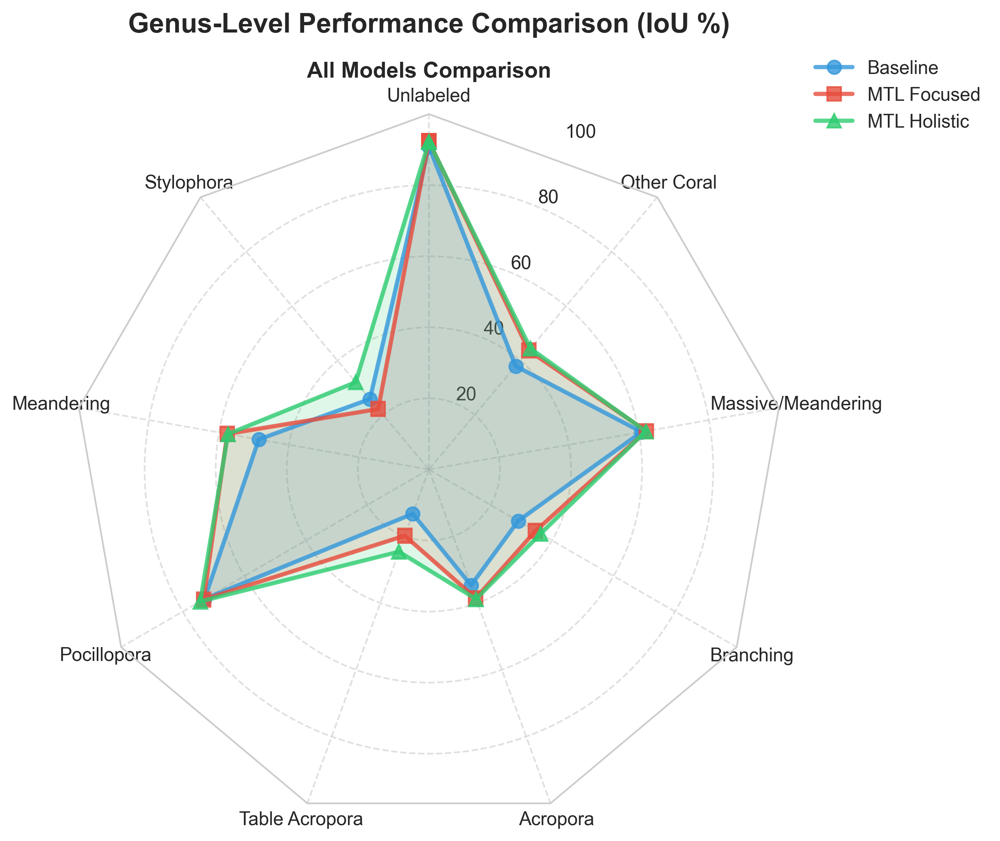

✅ Saved: extra_plots_stats\genus_radar_comparison_all_models.png

📊 Radar chart shows IoU performance across all 8 coral genera for all three models
   Blue: Baseline | Red: MTL Focused | Green: MTL Holistic
   Larger area = better performance across genera


In [31]:
# Create genus radar chart comparing ALL THREE MODELS
fig = plt.figure(figsize=(14, 7))
fig.suptitle('Genus-Level Performance Comparison (IoU %)', fontsize=16, fontweight='bold', y=0.98)

# Create radar axes
num_vars = len(genus_classes)
theta = radar_factory(num_vars, frame='polygon')

# Single subplot for comprehensive comparison
ax = fig.add_subplot(1, 1, 1, projection='radar')

# Plot all three models
ax.plot(theta, baseline_genus_scores, 'o-', linewidth=2.5, label='Baseline', 
        color='#3498db', markersize=8, alpha=0.8)
ax.fill(theta, baseline_genus_scores, alpha=0.15, color='#3498db')

ax.plot(theta, mtl_focused_genus_scores, 's-', linewidth=2.5, label='MTL Focused', 
        color='#e74c3c', markersize=8, alpha=0.8)
ax.fill(theta, mtl_focused_genus_scores, alpha=0.15, color='#e74c3c')

ax.plot(theta, mtl_holistic_genus_scores, '^-', linewidth=2.5, label='MTL Holistic', 
        color='#2ecc71', markersize=8, alpha=0.8)
ax.fill(theta, mtl_holistic_genus_scores, alpha=0.15, color='#2ecc71')

ax.set_varlabels([g.replace('_', ' ').title() for g in genus_classes])
ax.set_ylim(0, 100)
ax.set_title('All Models Comparison', weight='bold', size=13, position=(0.5, 1.12))
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=11, framealpha=0.9)
ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'genus_radar_comparison_all_models.png', bbox_inches='tight', dpi=300)
plt.show()

print(f"✅ Saved: {OUTPUT_DIR / 'genus_radar_comparison_all_models.png'}")
print("\n📊 Radar chart shows IoU performance across all 8 coral genera for all three models")
print("   Blue: Baseline | Red: MTL Focused | Green: MTL Holistic")
print("   Larger area = better performance across genera")

📊 Extracting health metrics for all models...
Health classes (grouped): ['unlabeled', 'alive coral', 'bleached coral', 'dead coral']
Baseline health scores: ['90.90', '63.38', '53.93', '16.05']
MTL Focused health scores: ['92.07', '67.18', '64.06', '20.56']
MTL Holistic health scores: ['92.10', '68.91', '66.66', '18.06']


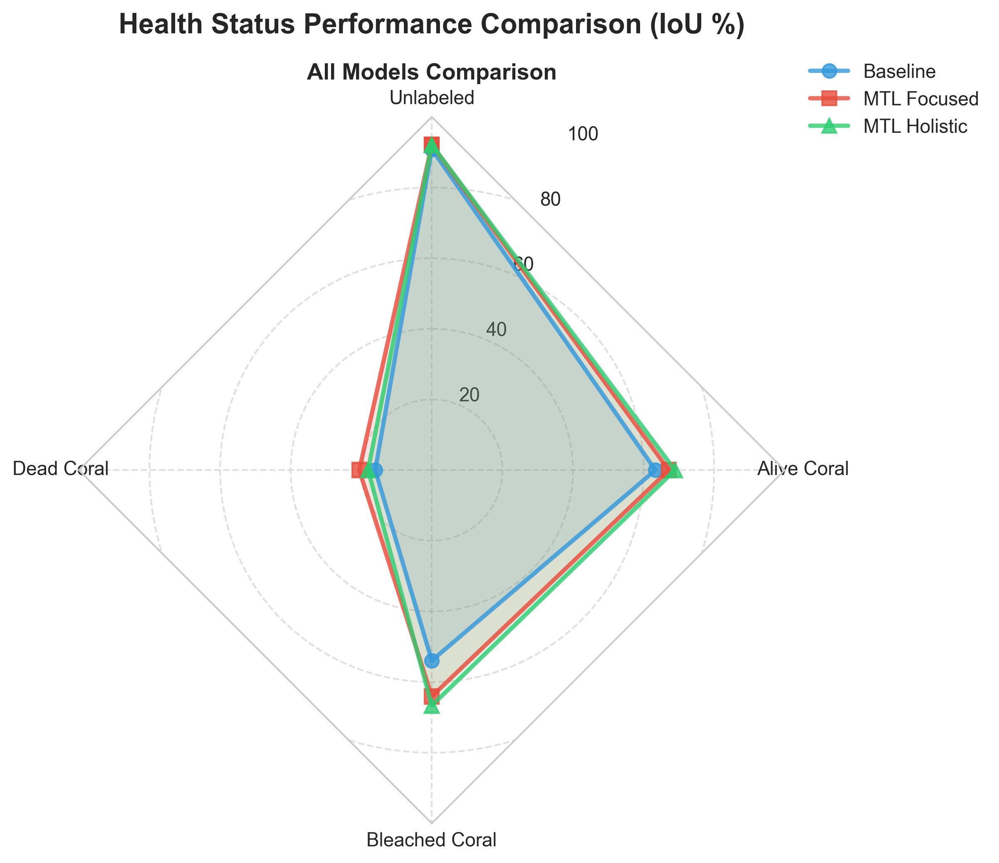

✅ Saved: extra_plots_stats\health_radar_comparison_all_models.png

📊 Radar chart shows IoU performance across health status categories for all three models
   Blue: Baseline | Red: MTL Focused | Green: MTL Holistic
   Larger area = better performance across health categories

✅ Health metrics extracted and visualized for all three models!
💡 All models now show per-health breakdown from their task-specific metrics


In [32]:
# Extract health performance metrics for ALL THREE MODELS and create radar chart
print("📊 Extracting health metrics for all models...")

# Get GROUPED health class names from MTL splitter (4 classes: unlabeled + alive + bleached + dead)
health_id2label = mtl_splitter.hierarchical_definitions['health']['grouped']['id2label']
health_classes = list(health_id2label.values())
print(f"Health classes (grouped): {health_classes}")

# Baseline: Extract from health task (it has the same structure!)
baseline_health_scores = []
baseline_health_metrics = baseline_results.get('tasks', {}).get('health', {}).get('grouped', {})
for health_id, health_name in health_id2label.items():
    class_metrics = baseline_health_metrics.get('per_class', {}).get(health_name, {})
    baseline_health_scores.append(class_metrics.get('IoU', 0.0) * 100)

print(f"Baseline health scores: {[f'{s:.2f}' for s in baseline_health_scores]}")

# MTL Focused: Extract from health task
mtl_focused_health_scores = []
health_metrics_focused = mtl_focused_results.get('tasks', {}).get('health', {}).get('grouped', {})
for health_id, health_name in health_id2label.items():
    class_metrics = health_metrics_focused.get('per_class', {}).get(health_name, {})
    mtl_focused_health_scores.append(class_metrics.get('IoU', 0.0) * 100)

print(f"MTL Focused health scores: {[f'{s:.2f}' for s in mtl_focused_health_scores]}")

# MTL Holistic: Extract from health task
mtl_holistic_health_scores = []
health_metrics_holistic = mtl_holistic_results.get('tasks', {}).get('health', {}).get('grouped', {})
for health_id, health_name in health_id2label.items():
    class_metrics = health_metrics_holistic.get('per_class', {}).get(health_name, {})
    mtl_holistic_health_scores.append(class_metrics.get('IoU', 0.0) * 100)

print(f"MTL Holistic health scores: {[f'{s:.2f}' for s in mtl_holistic_health_scores]}")

# Create health radar chart
fig = plt.figure(figsize=(14, 7))
fig.suptitle('Health Status Performance Comparison (IoU %)', fontsize=16, fontweight='bold', y=0.98)

# Create radar axes
num_vars = len(health_classes)
theta = radar_factory(num_vars, frame='polygon')

# Single subplot for comprehensive comparison
ax = fig.add_subplot(1, 1, 1, projection='radar')

# Plot all three models
ax.plot(theta, baseline_health_scores, 'o-', linewidth=2.5, label='Baseline', 
        color='#3498db', markersize=8, alpha=0.8)
ax.fill(theta, baseline_health_scores, alpha=0.15, color='#3498db')

ax.plot(theta, mtl_focused_health_scores, 's-', linewidth=2.5, label='MTL Focused', 
        color='#e74c3c', markersize=8, alpha=0.8)
ax.fill(theta, mtl_focused_health_scores, alpha=0.15, color='#e74c3c')

ax.plot(theta, mtl_holistic_health_scores, '^-', linewidth=2.5, label='MTL Holistic', 
        color='#2ecc71', markersize=8, alpha=0.8)
ax.fill(theta, mtl_holistic_health_scores, alpha=0.15, color='#2ecc71')

ax.set_varlabels([h.replace('_', ' ').title() for h in health_classes])
ax.set_ylim(0, 100)
ax.set_title('All Models Comparison', weight='bold', size=13, position=(0.5, 1.12))
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=11, framealpha=0.9)
ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'health_radar_comparison_all_models.png', bbox_inches='tight', dpi=300)
plt.show()

print(f"✅ Saved: {OUTPUT_DIR / 'health_radar_comparison_all_models.png'}")
print("\n📊 Radar chart shows IoU performance across health status categories for all three models")
print("   Blue: Baseline | Red: MTL Focused | Green: MTL Holistic")
print("   Larger area = better performance across health categories")

print("\n✅ Health metrics extracted and visualized for all three models!")
print(f"💡 All models now show per-health breakdown from their task-specific metrics")